# Imports

In [702]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from collections import Counter
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors

from kmodes.kprototypes import KPrototypes 

random_state = 42

# Reading

In [703]:
df = pd.read_sas('a2z_insurance.sas7bdat')
df['CustID'] = df['CustID'].astype('int')
df = df.set_index('CustID')

print('Dataframe shape:', df.shape)

Dataframe shape: (10296, 13)


In [704]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10296 entries, 1 to 10296
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


In [705]:
df.head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


# Data Preparation

In [706]:
numerical_col_list = ['FirstPolYear', 'BirthYear', 'MonthSal', 'CustMonVal', 
                'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth',
                'PremLife', 'PremWork']
categorical_col_list = ['EducDeg', 'GeoLivArea','Children'] 
ordinal_col_list = ['EducDeg']
nominal_col_list = ['GeoLivArea','Children']

## Data wrangling

In [707]:
# Fix EducDeg column value

def educDegtransform(row):
    row = row.decode("utf-8") if type(row) == bytes else row 
    if type(row) == str:
        educ_dict = {
            '1 - Basic': 1,
            '2 - High School': 2,
            '3 - BSc/MSc': 3,
            '4 - PhD': 4
        }
        return educ_dict[row]
    else:
        return row

df['EducDeg'] = df['EducDeg'].apply(lambda row: educDegtransform(row)) 

## Duplicated Values

In [708]:
print("Duplicated rows: ", df[df.duplicated(keep='first')].shape[0])
df = df[~df.duplicated(keep='first')]

Duplicated rows:  3


## Coherence Check

### Birth Year absurd values

In [709]:
def print_metrics(data, column, name):
    print(f"{name} Mode: {data[column].mode()[0]}")
    print(f"{name} Median: {data[column].median()}")
    print(f"{name} Mean: {data[column].mean():.2f}")
    print(f"{name} Std: {data[column].std():.2f}")
    return

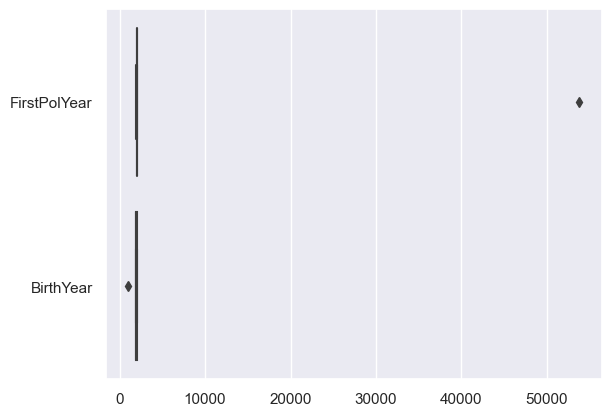

In [710]:
sns.boxplot(data=df[['FirstPolYear', 'BirthYear']], 
orient="h", 
palette="mako")
plt.show()

In [711]:
print('Outlier BirthYear', df['BirthYear'].min())
print('Outlier FirstPolYear', df['FirstPolYear'].max())

Outlier BirthYear 1028.0
Outlier FirstPolYear 53784.0


In [712]:
df = df[df['BirthYear'] != 1028]
df = df[df['FirstPolYear'] != 53784] #Removes the outlier value 

### BirthYear and FirstPolYear

In [713]:
print(f"People who were born after taking out insurance are {(((df[(df['FirstPolYear'] - df['BirthYear']) < 0].shape[0])/df.shape[0])*100):.2f}%")

People who were born after taking out insurance are 19.41%


In [714]:
print("Underage people who has insurance:", df[((2016 - df['BirthYear']) >= 15)&((2016 - df['BirthYear']) < 18)].shape[0])

Underage people who has insurance: 116


In [715]:
df = df.drop('FirstPolYear', axis=1)
numerical_col_list.remove('FirstPolYear')
print('Dataframe shape:', df.shape)

Dataframe shape: (10291, 12)


## Tratamento Outliers

### Univariate

In [716]:
def apply_limits_sup_inf(data, column, limits):
    
    def limit_apply(row, inf_limit, sup_limit):
        if row > sup_limit:
            return sup_limit
        elif row < inf_limit:
            return inf_limit
        else:
            return row

    if not limits:
        inf_lim = data[column].mean() - 3*data[column].std()
        sup_lim = data[column].mean() + 3*data[column].std()
    else:
        inf_lim = limits[0]
        sup_lim = limits[1]

    return data[column].apply(lambda row: limit_apply(row, inf_lim, sup_lim))

def plot_all_boxplots(df,metric_features):
	# All Numeric Variables' Box Plots in one figure
	sns.set()
	
	# Prepare figure. Create individual axes where each box plot will be placed
	fig, axes = plt.subplots(2, int(np.ceil(len(metric_features) / 2)), figsize=(20, 13))
	
	# Plot data
	# Iterate across axes objects and associate each box plot (hint: use the ax argument):
	for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
	    # CODE HERE
	    ax.boxplot(df[feat].dropna())
	    ax.set_title(feat,y=-.13)
	    
	# Layout
	# Add a centered title to the figure:
	title = 'Numeric Variables\' Box Plots' # notice the "\"
	fig.suptitle(title, fontsize=20)
	plt.show()

def plot_all_histograms(df,metric_features):
	# All Numeric Variables' Box Plots in one figure
	sns.set()
	
	# Prepare figure. Create individual axes where each box plot will be placed
	fig, axes = plt.subplots(2, int(np.ceil(len(metric_features) / 2)), figsize=(20, 13))
	
	# Plot data
	# Iterate across axes objects and associate each box plot (hint: use the ax argument):
	for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
	    # CODE HERE
	    ax.hist(df[feat].dropna())
	    ax.set_title(feat,y=-.13)
	    
	# Layout
	# Add a centered title to the figure:
	title = 'Numeric Variables\' Histograms' # notice the "\"
	fig.suptitle(title, fontsize=20)
	plt.show()

def plot_all_countplots(df,categorical_features):
    sns.set()
    # Prepare figure. Create individual axes where each box plot will be placed
    fig, axes = plt.subplots(2, int(np.ceil(len(categorical_features) / 2)), figsize=(20, 13))
    
    # Plot data
    # Iterate across axes objects and associate each box plot (hint: use the ax argument):
    for ax, feat in zip(axes.flatten(), categorical_features): # Notice the zip() function and flatten() method
        sns.countplot(x = df[feat],ax=ax,palette='Set2',order=df[feat].value_counts().index)
        ax.set_title(feat,y=-.13)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

        
    # Layout
    # Add a centered title to the figure:
    title = 'Categorical Variables\' Count Plots' # notice the "\"
    
    plt.show()

def return_tuple_max_min(data, column):
    return (data[column].min(), data[column].max())

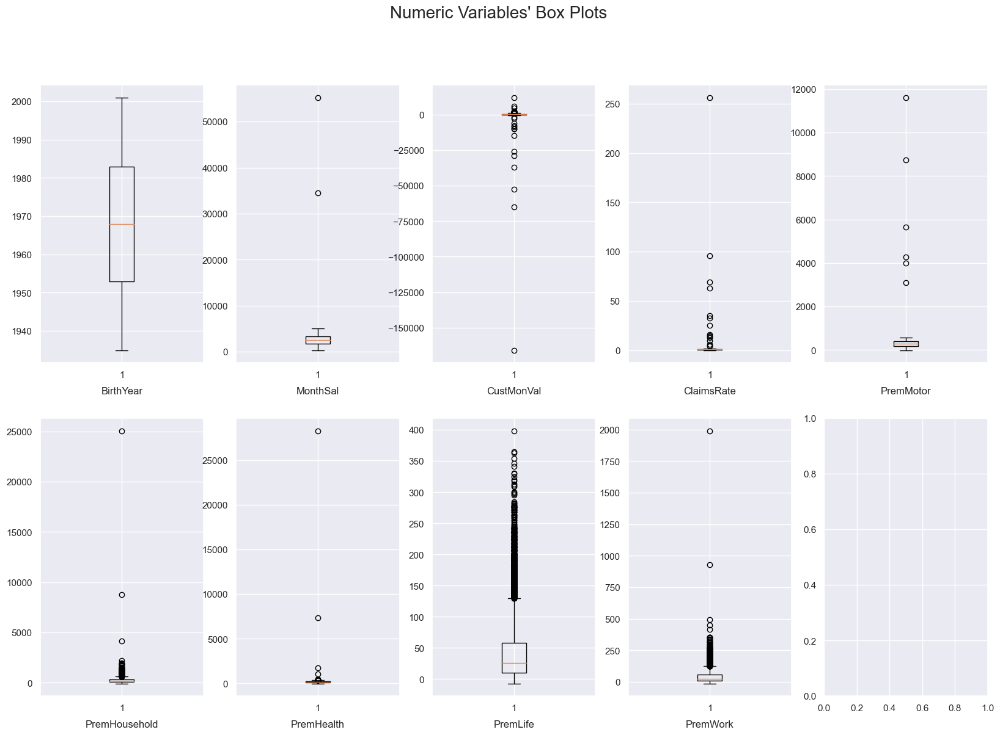

In [717]:
plot_all_boxplots(df, numerical_col_list)

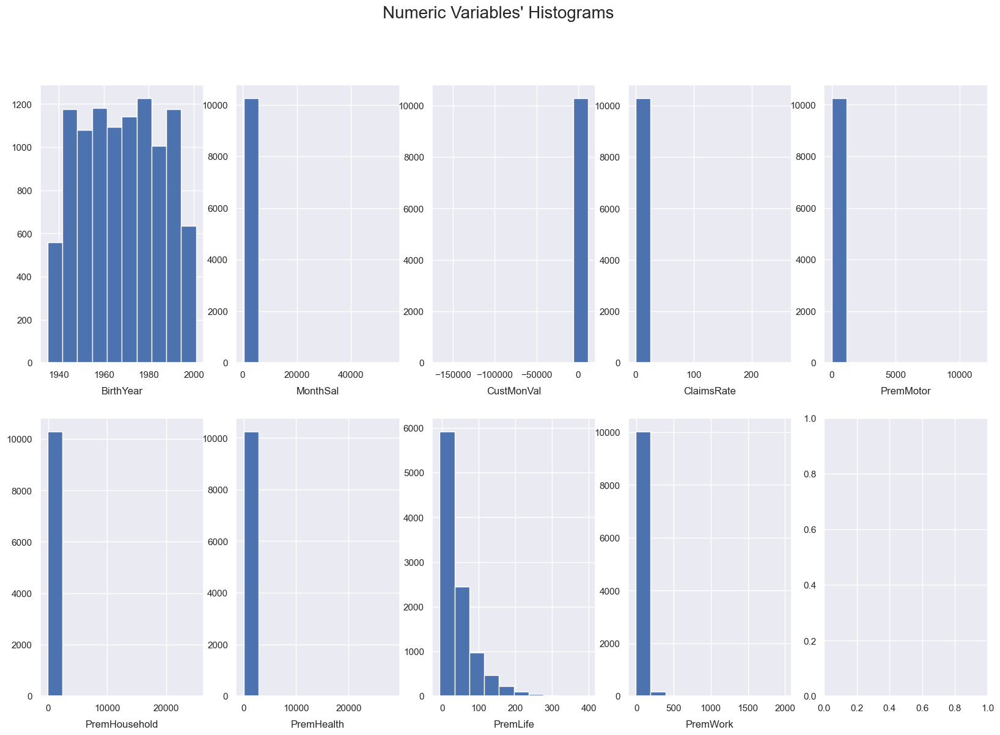

In [718]:
plot_all_histograms(df, numerical_col_list)

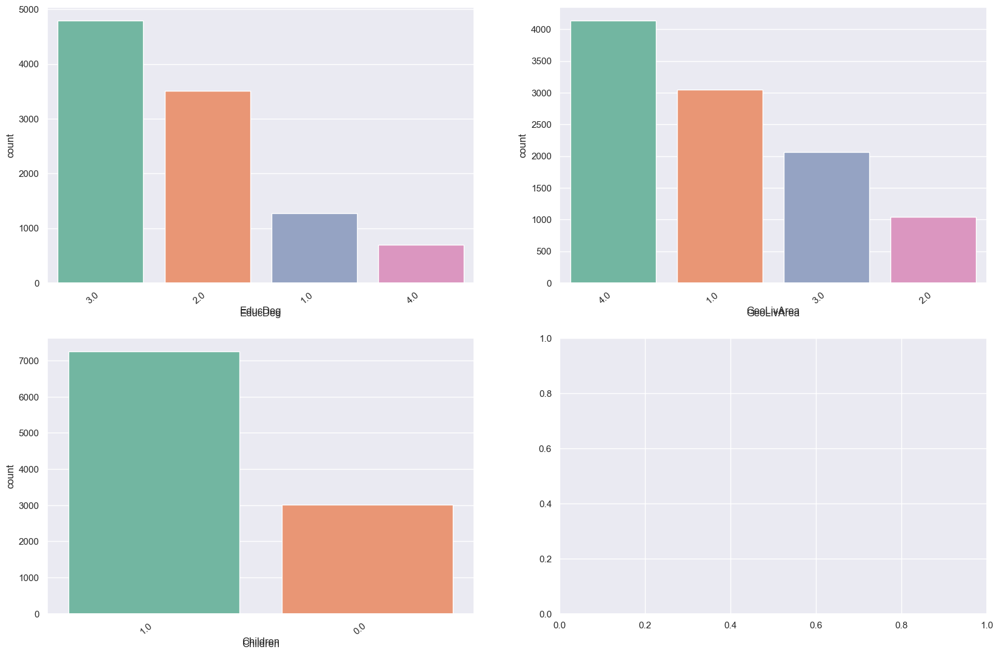

In [719]:
plot_all_countplots(df, categorical_col_list)

#### MonthSal

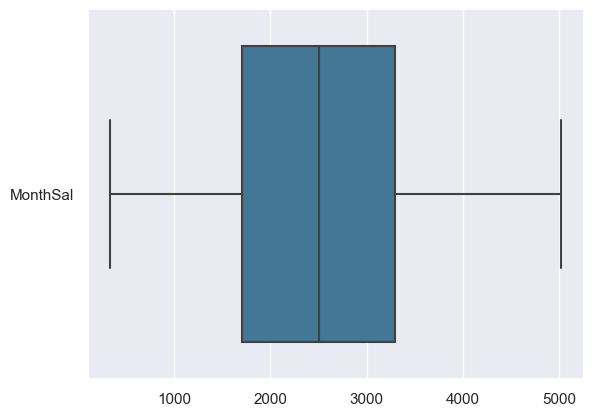

In [720]:
sns.boxplot(data=df[df['MonthSal'] < 10000][['MonthSal']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako")
plt.show()

In [721]:
df = df[df['MonthSal'] < 10000]

#### CustMonVal

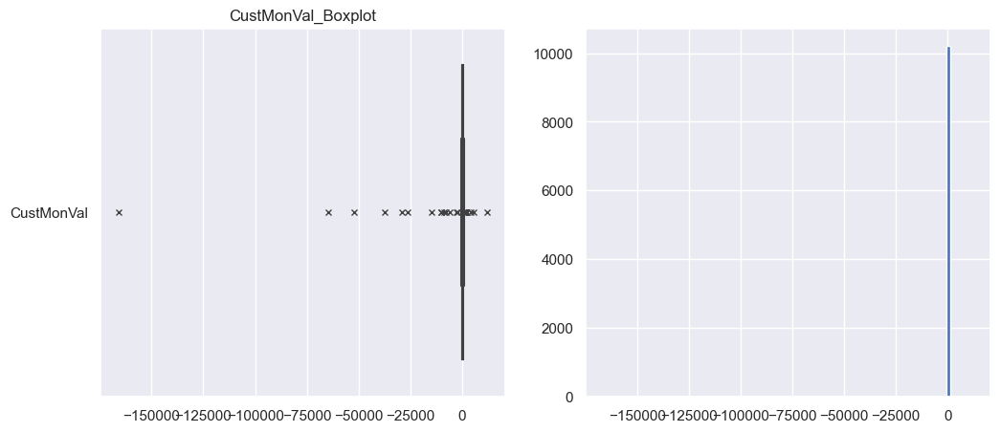

In [722]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['CustMonVal']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('CustMonVal_Boxplot')

df['CustMonVal'].hist(bins=100, figsize=(12,5), ax=ax[1])
plt.show() 

In [723]:
print("CustMonVal outliers: ", (df[~((-500<df['CustMonVal'])&(df['CustMonVal']<=1000))]).shape[0])
df_CustMonVal = df[((-500<=df['CustMonVal'])&(df['CustMonVal']<=1000))].copy()
CMV_limits = return_tuple_max_min(df_CustMonVal, 'CustMonVal')
df['CustMonVal'] = apply_limits_sup_inf(df, 'CustMonVal', CMV_limits)

CustMonVal outliers:  115


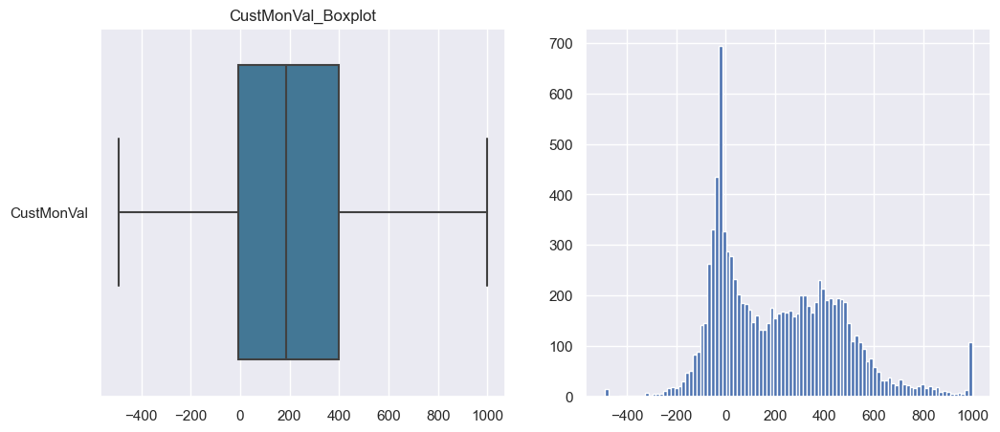

In [724]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['CustMonVal']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('CustMonVal_Boxplot')

df['CustMonVal'].hist(bins=100, figsize=(12,5), ax=ax[1])
plt.show() 

#### ClaimsRate

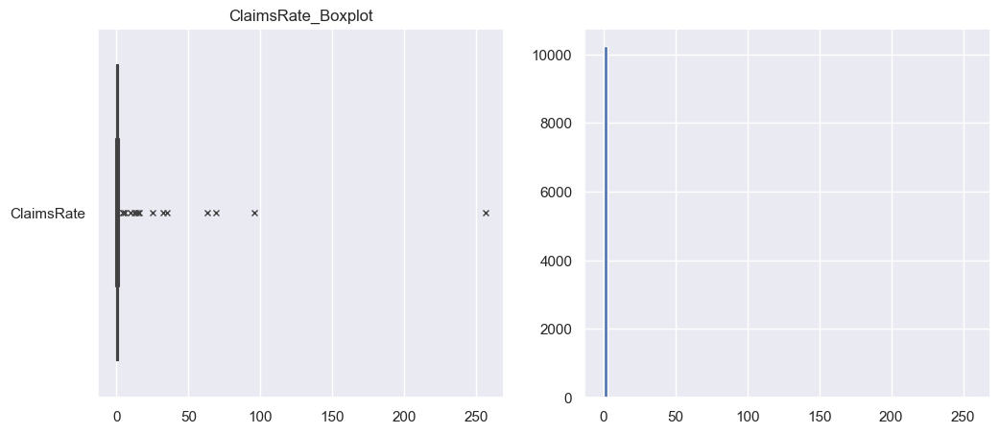

In [725]:

f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['ClaimsRate']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('ClaimsRate_Boxplot')

df['ClaimsRate'].hist(bins=100, figsize=(12,5), ax=ax[1])
plt.show() 

In [726]:
print("ClaimsRate outliers ", df[df['ClaimsRate'] > 4].shape[0])
df_ClaimsRate = df[df['ClaimsRate'] < 4].copy()
ClaimsRate_limits = return_tuple_max_min(df_ClaimsRate, 'ClaimsRate')
df['ClaimsRate'] = apply_limits_sup_inf(df, 'ClaimsRate', ClaimsRate_limits)

ClaimsRate outliers  15


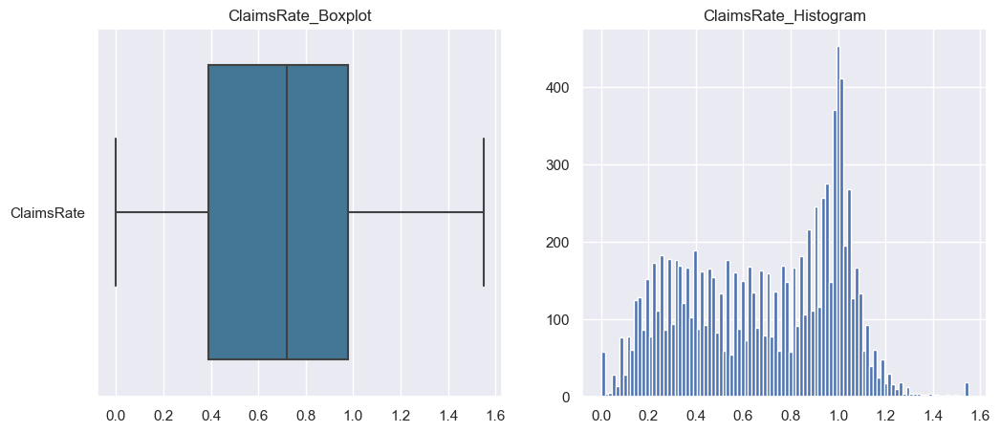

In [727]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['ClaimsRate']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('ClaimsRate_Boxplot')

df['ClaimsRate'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('ClaimsRate_Histogram')
plt.show() 

#### PremMotor

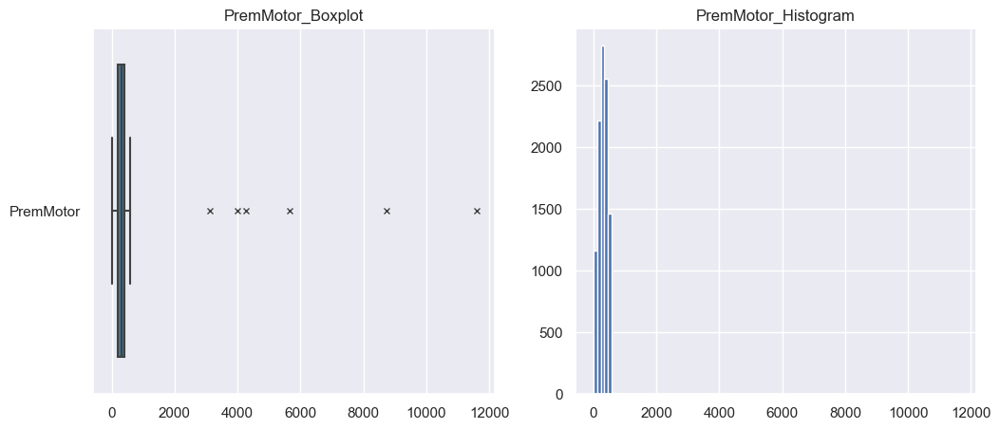

In [728]:

f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremMotor']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremMotor_Boxplot')

df['PremMotor'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremMotor_Histogram')
plt.show() 

In [729]:
print("PremMotor outliers ", df[df['PremMotor'] > 2000].shape[0])
df_PremMotor = df[df['PremMotor'] < 2000].copy()
PremMotor_limits = return_tuple_max_min(df_PremMotor, 'PremMotor')
df['PremMotor'] = apply_limits_sup_inf(df, 'PremMotor', PremMotor_limits)

PremMotor outliers  6


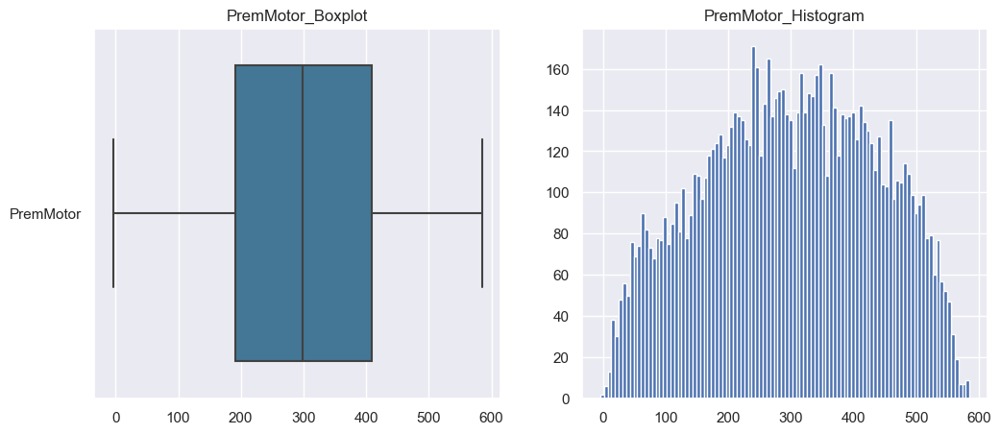

In [730]:

f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremMotor']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremMotor_Boxplot')

df['PremMotor'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremMotor_Histogram')
plt.show() 

#### PremHousehold

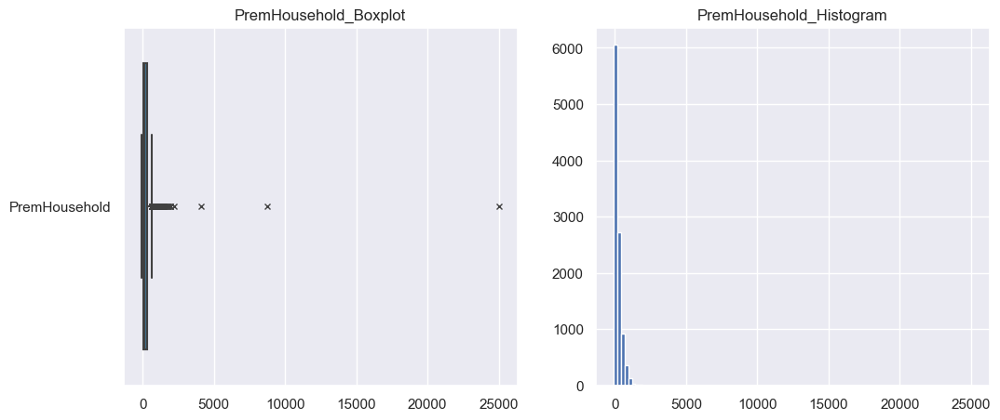

In [731]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremHousehold']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremHousehold_Boxplot')

df['PremHousehold'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremHousehold_Histogram')
plt.show() 

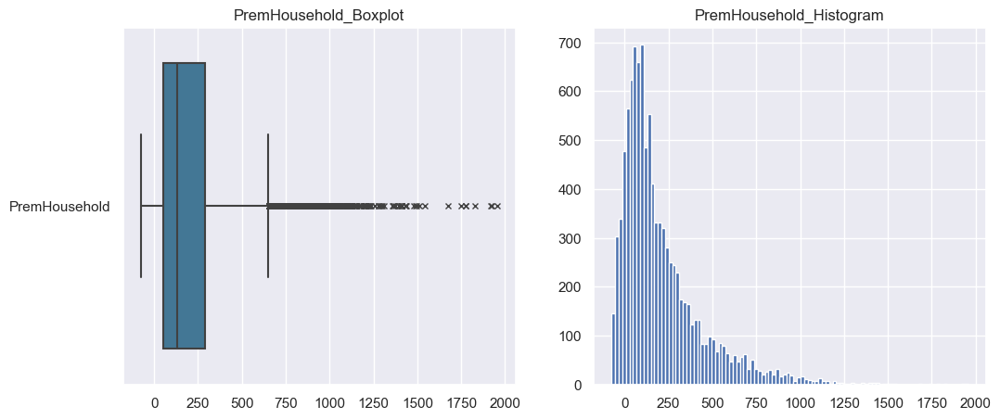

In [732]:
#Checking distribution with upper limit on 2000

f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[df['PremHousehold'] < 2000][['PremHousehold']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremHousehold_Boxplot')

df[df['PremHousehold'] < 2000]['PremHousehold'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremHousehold_Histogram')
plt.show() 

In [733]:
#Deciding to keep upper limit on 1250

print("PremHousehold outliers ", df[df['PremHousehold'] > 1250].shape[0])
df_PremHousehold = df[df['PremHousehold'] < 1250]
PremHousehold_limits = return_tuple_max_min(df_PremHousehold, 'PremHousehold')
df['PremHousehold'] = apply_limits_sup_inf(df, 'PremHousehold', PremHousehold_limits)

PremHousehold outliers  37


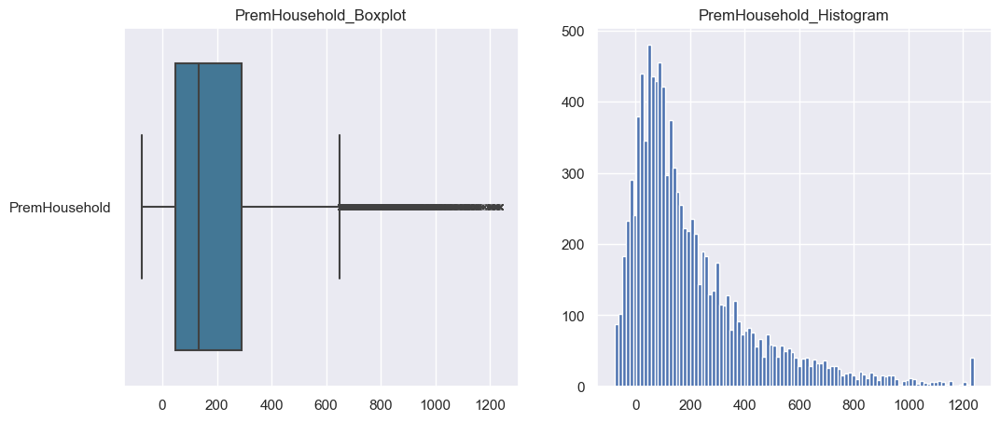

In [734]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremHousehold']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremHousehold_Boxplot')

df['PremHousehold'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremHousehold_Histogram')
plt.show() 

#### PremHealth

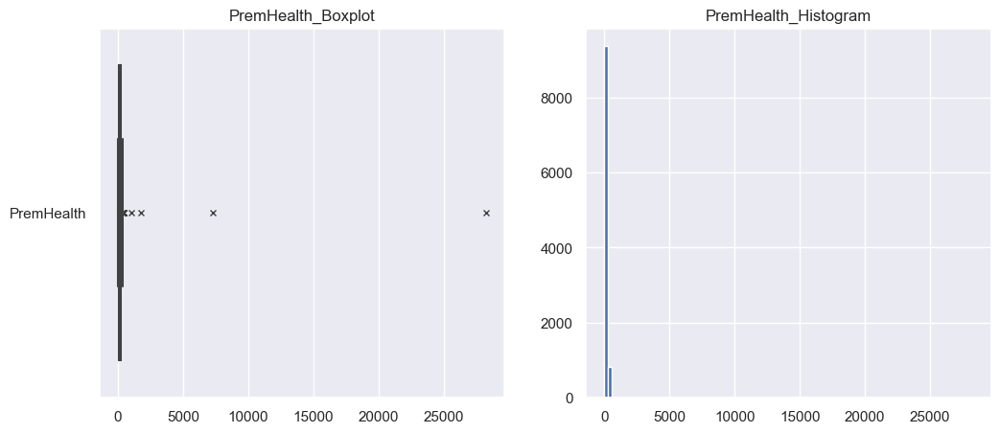

In [735]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremHealth']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremHealth_Boxplot')

df['PremHealth'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremHealth_Histogram')
plt.show() 

In [736]:
print("PremHealth outliers ", df[df['PremHealth'] > 400].shape[0])
df_PremHealth = df[df['PremHealth'] < 400]
PremHealth_limits = return_tuple_max_min(df_PremHealth, 'PremHealth')
df['PremHealth'] = apply_limits_sup_inf(df, 'PremHealth', PremHealth_limits)

PremHealth outliers  11


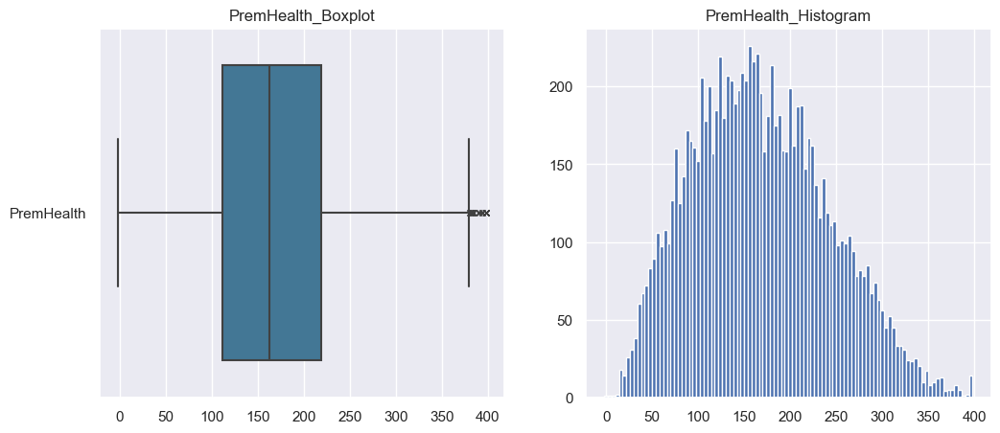

In [737]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremHealth']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremHealth_Boxplot')

df['PremHealth'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremHealth_Histogram')
plt.show() 

#### PremLife

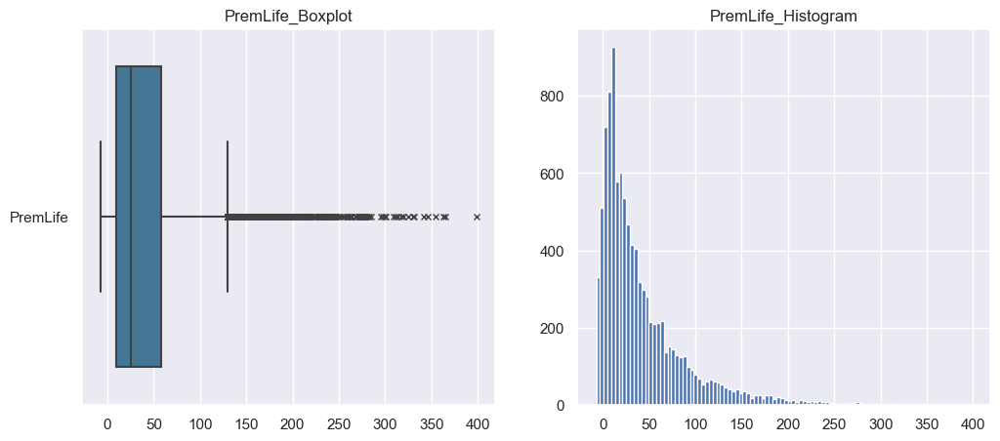

In [738]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremLife']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremLife_Boxplot')

df['PremLife'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremLife_Histogram')
plt.show() 

In [739]:
print("PremLife outliers ", df[df['PremLife'] > 250].shape[0])
df_PremLife = df[df['PremLife'] < 250]
PremLife_limits = return_tuple_max_min(df_PremLife, 'PremLife')
df['PremLife'] = apply_limits_sup_inf(df, 'PremLife', PremLife_limits)

PremLife outliers  50


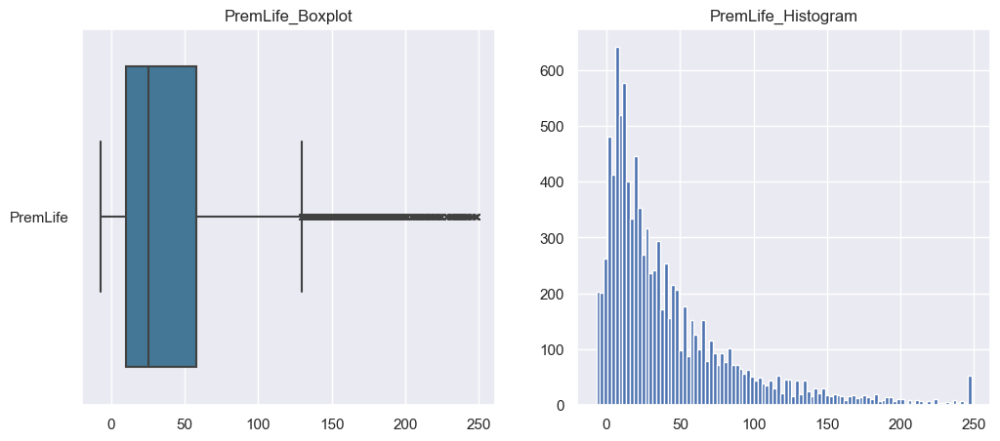

In [740]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremLife']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremLife_Boxplot')

df['PremLife'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremLife_Histogram')
plt.show() 

#### PremWork

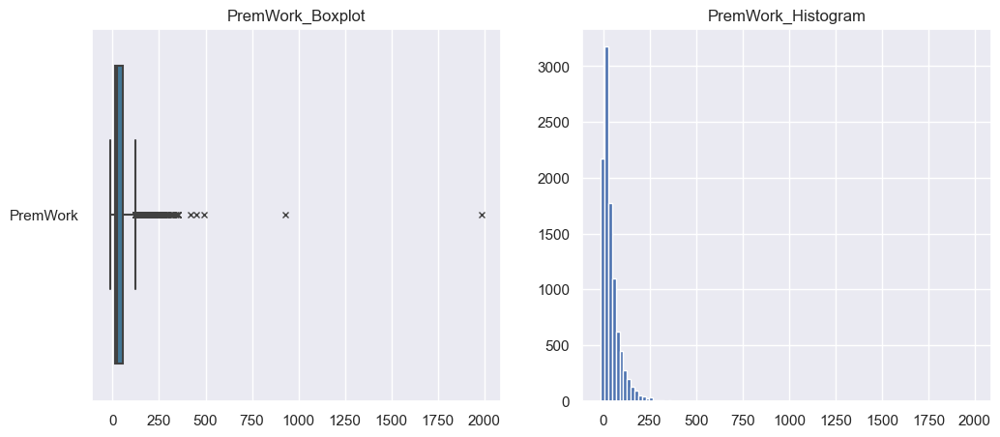

In [741]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremWork']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremWork_Boxplot')

df['PremWork'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremWork_Histogram')
plt.show() 

In [742]:
print("PremWork outliers ", df[df['PremWork'] > 250].shape[0])
df_PremWork = df[df['PremWork'] < 250]
PremWork_limits = return_tuple_max_min(df_PremWork, 'PremWork')
df['PremWork'] = apply_limits_sup_inf(df, 'PremWork', PremWork_limits)

PremWork outliers  55


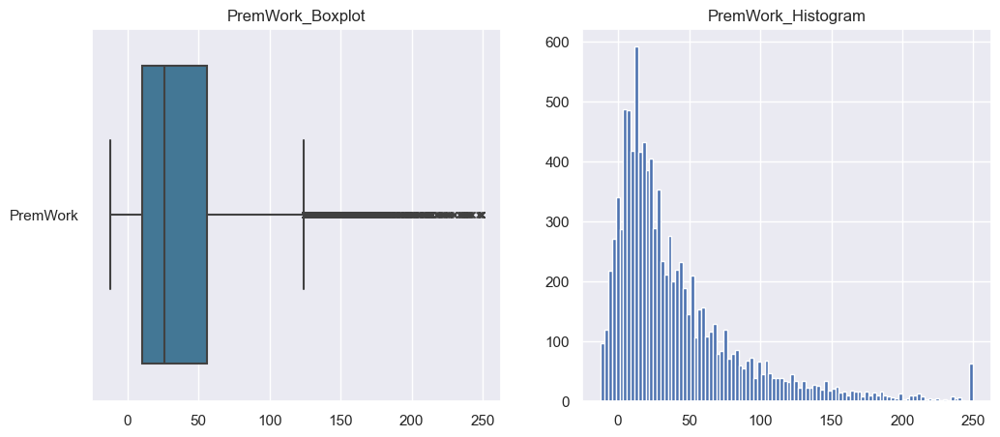

In [743]:
f,ax = plt.subplots(1,2,figsize=(18,8))

sns.boxplot(data=df[['PremWork']], 
orient="h",
flierprops={"marker": "x"}, 
palette="mako",
ax=ax[0])
ax[0].set_title('PremWork_Boxplot')

df['PremWork'].hist(bins=100, figsize=(12,5), ax=ax[1])
ax[1].set_title('PremWork_Histogram')
plt.show() 

### Missing Values

In [744]:
df_treat_nan = df.copy()
print("Dataset shape before dropping NaNs ", df_treat_nan.shape)

Dataset shape before dropping NaNs  (10253, 12)


#### Numerical

In [745]:
nans_index = df_treat_nan.isna().any(axis=1)
df_treat_nan[numerical_col_list][nans_index].head()

,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,
69,1977.0,1399.0,476.65,0.33,330.73,186.70,211.15,NaN,15.78
139,1976.0,2538.0,149.59,0.69,194.26,305.60,NaN,37.34,17.67
185,1984.0,2419.0,-62.23,1.07,NaN,253.95,230.60,5.89,43.12
195,1978.0,2349.0,-101.00,1.14,469.31,-65.00,115.80,NaN,11.00
297,1955.0,3591.0,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89


In [746]:
imputer = KNNImputer(n_neighbors=5, weights="uniform")
df_treat_nan[numerical_col_list] = imputer.fit_transform(df_treat_nan[numerical_col_list])
df_treat_nan.loc[nans_index, numerical_col_list].head()

,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,
69,1977.0,1399.0,476.65,0.33,330.73,186.70,211.150,33.784,15.78
139,1976.0,2538.0,149.59,0.69,194.26,305.60,226.598,37.340,17.67
185,1984.0,2419.0,-62.23,1.07,251.87,253.95,230.600,5.890,43.12
195,1978.0,2349.0,-101.00,1.14,469.31,-65.00,115.800,11.024,11.00
297,1955.0,3591.0,-49.11,1.04,447.64,-25.00,130.580,0.890,12.89


#### Categorical

In [747]:
modes = df_treat_nan[categorical_col_list].mode().loc[0]
modes

EducDeg       3.0
GeoLivArea    4.0
Children      1.0
Name: 0, dtype: float64

In [748]:
df_treat_nan.fillna(modes, inplace=True)
df_treat_nan.isna().sum()

BirthYear        0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

#### Fix columns type

In [749]:
convert_dict = {#'FirstPolYear': int,
                'BirthYear': int,
                'EducDeg': int,
                'GeoLivArea': int,
                'Children': int}
 
df_treat_nan = df_treat_nan.astype(convert_dict) 

print("Dataset shape after dropping NaNs ", df_treat_nan.shape)

Dataset shape after dropping NaNs  (10253, 12)


### Multivariate

In [750]:
#Find multivariate outliers with DBSCAN

df_to_dbscan = df_treat_nan[numerical_col_list].copy()
#Scale the data
scaler = StandardScaler()
df_to_dbscan[numerical_col_list] = scaler.fit_transform(df_to_dbscan[numerical_col_list])
#Fit DBSCAN
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_to_dbscan)
#Add the labels to the dataframe
df_to_dbscan['dbscan_labels'] = dbscan_labels
#Count the number of outliers
Counter(dbscan_labels)





Counter({0: 10192, -1: 61})

In [751]:
#Drop the outliers
outliers_idx = df_to_dbscan[df_to_dbscan['dbscan_labels'] == -1].index
df_wo_out = df_treat_nan.drop(outliers_idx).copy()

print("Number of outliers: {}\n Original dataset shape : {}\n Without outlier dataset shape: {} ".format(
   len(outliers_idx),
    df_treat_nan.shape,
    df_wo_out.shape))

Number of outliers: 61
 Original dataset shape : (10253, 12)
 Without outlier dataset shape: (10192, 12) 


# Feature Engeneering

## Feature Creation

In [752]:
df_wo_out.head()

,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
1,1982,2,2177.0,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1995,2,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1970,1,2277.0,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1981,3,1099.0,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1973,3,1763.0,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [753]:
#Feature engineering

#Create a new feature: Total premium
df_wo_out['TotalPrem'] = df_wo_out['PremWork'] + df_wo_out['PremLife'] + df_wo_out['PremHealth'] + df_wo_out['PremMotor'] + df_wo_out['PremHousehold']
#Create a new feature: Ratios of premium
df_wo_out['WorkPrem_ratio'] = df_wo_out['PremWork'] / df_wo_out['TotalPrem']
df_wo_out['LifePrem_ratio'] = df_wo_out['PremLife'] / df_wo_out['TotalPrem']
df_wo_out['HealthPrem_ratio'] = df_wo_out['PremHealth'] / df_wo_out['TotalPrem']
df_wo_out['MotorPrem_ratio'] = df_wo_out['PremMotor'] / df_wo_out['TotalPrem']
df_wo_out['HouseholdPrem_ratio'] = df_wo_out['PremHousehold'] / df_wo_out['TotalPrem']
#Create a new feature: Risk budget
df_wo_out['RiskBudget'] = df_wo_out['TotalPrem'] /  (df_wo_out['MonthSal']*12) 
#Create a new feature: Cancelation
df_wo_out['has_cancelled'] = df_wo_out[['PremWork', 'PremLife', 'PremHealth', 'PremMotor', 'PremHousehold']].apply(lambda x: 1 if x.min() < 0 else 0, axis=1)
#Update the list of numerical and ordinal columns
numerical_col_list = numerical_col_list + ['TotalPrem', 'WorkPrem_ratio', 'LifePrem_ratio', 'HealthPrem_ratio', 'MotorPrem_ratio', 'HouseholdPrem_ratio', 'RiskBudget']
ordinal_col_list.append('has_cancelled')
categorical_col_list.append('has_cancelled')


print("Numerical columns: ", numerical_col_list)
print("Ordinal columns: ", ordinal_col_list)
print("Categorical columns: ", categorical_col_list)
print("Dataset shape after feature engineering ", df_wo_out.shape)

Numerical columns:  ['BirthYear', 'MonthSal', 'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork', 'TotalPrem', 'WorkPrem_ratio', 'LifePrem_ratio', 'HealthPrem_ratio', 'MotorPrem_ratio', 'HouseholdPrem_ratio', 'RiskBudget']
Ordinal columns:  ['EducDeg', 'has_cancelled']
Categorical columns:  ['EducDeg', 'GeoLivArea', 'Children', 'has_cancelled']
Dataset shape after feature engineering  (10192, 20)


## Feature Selection

In [754]:
def plot_correlation_heatmap(df,metric_features,corr_method = 'pearson'):
    #Correlation heatmap
    corr = df[metric_features].corr(method=corr_method)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot= True,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.show()
# Create a function to return for each column, the number of columns that have a correlation higher than a threshold and the list of these columns. Disconsider the correlation with the column itself.
def get_high_correlated_columns(df, threshold, col_list):
    corr = df[col_list].corr(method='pearson')
    corr = corr.abs().unstack()
    corr = corr.sort_values(ascending=False)
    corr = corr[corr >= threshold]
    corr = corr[corr < 1]
    corr = pd.DataFrame(corr).reset_index()
    corr.columns = ['col1', 'col2', 'corr']
    corr = corr.groupby('col1')['col2'].agg(['count', 'unique']).reset_index()
    return corr.sort_values('count', ascending=False)


In [755]:
df_wo_out.head()

,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,has_cancelled
CustID,,,,,,,,,,,,,,,,,,,,
1,1982,2,2177.0,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89,665.56,0.025377,0.070632,0.219905,0.564712,0.119373,0.025477,0
2,1995,2,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,910.96,0.116503,0.213489,0.128096,0.085031,0.456881,0.112132,0
3,1970,1,2277.0,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,740.60,0.133702,0.116595,0.168215,0.278355,0.303133,0.027104,0
4,1981,3,1099.0,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,600.68,0.047180,0.058833,0.518030,0.303789,0.072168,0.045547,0
5,1973,3,1763.0,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45,629.24,0.065873,0.029846,0.290175,0.538141,0.075965,0.029743,0


### Correlation

In [756]:
df_wo_out.describe().T

,count,mean,std,min,25%,50%,75%,max
BirthYear,10192.0,1968.123332,17.354054,1935.000000,1953.000000,1968.000000,1983.000000,2001.000000
EducDeg,10192.0,2.483615,0.794277,1.000000,2.000000,3.000000,3.000000,4.000000
MonthSal,10192.0,2496.590071,982.941203,333.000000,1706.000000,2498.000000,3287.250000,5021.000000
GeoLivArea,10192.0,2.709870,1.266907,1.000000,1.000000,3.000000,4.000000,4.000000
Children,10192.0,0.708595,0.454432,0.000000,0.000000,1.000000,1.000000,1.000000
CustMonVal,10192.0,217.002227,251.271471,-490.200000,-9.000000,187.815000,399.860000,997.090000
ClaimsRate,10192.0,0.679517,0.318565,0.000000,0.390000,0.720000,0.980000,1.550000
PremMotor,10192.0,298.093145,137.842710,-4.110000,192.480000,299.500000,408.437500,585.220000
PremHousehold,10192.0,205.735969,230.641822,-75.000000,49.450000,132.800000,290.050000,1238.000000
PremHealth,10192.0,168.029522,74.092483,-2.110000,111.910000,162.920000,219.040000,398.410000


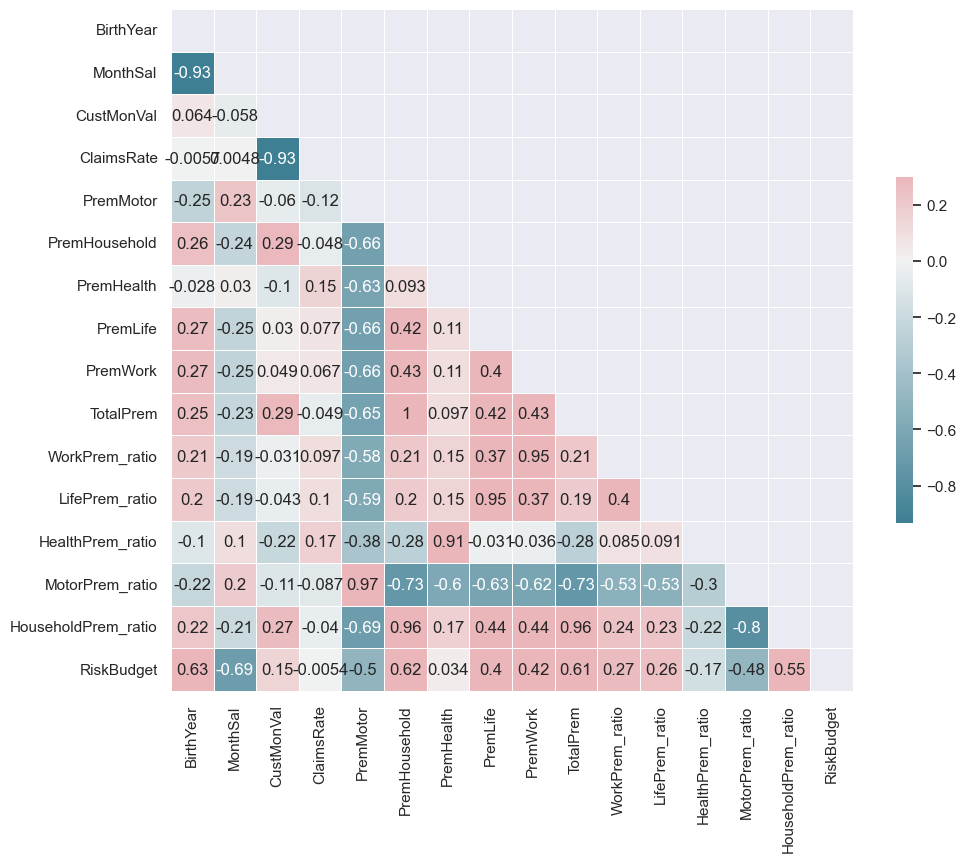

In [757]:
plot_correlation_heatmap(df_wo_out, numerical_col_list)

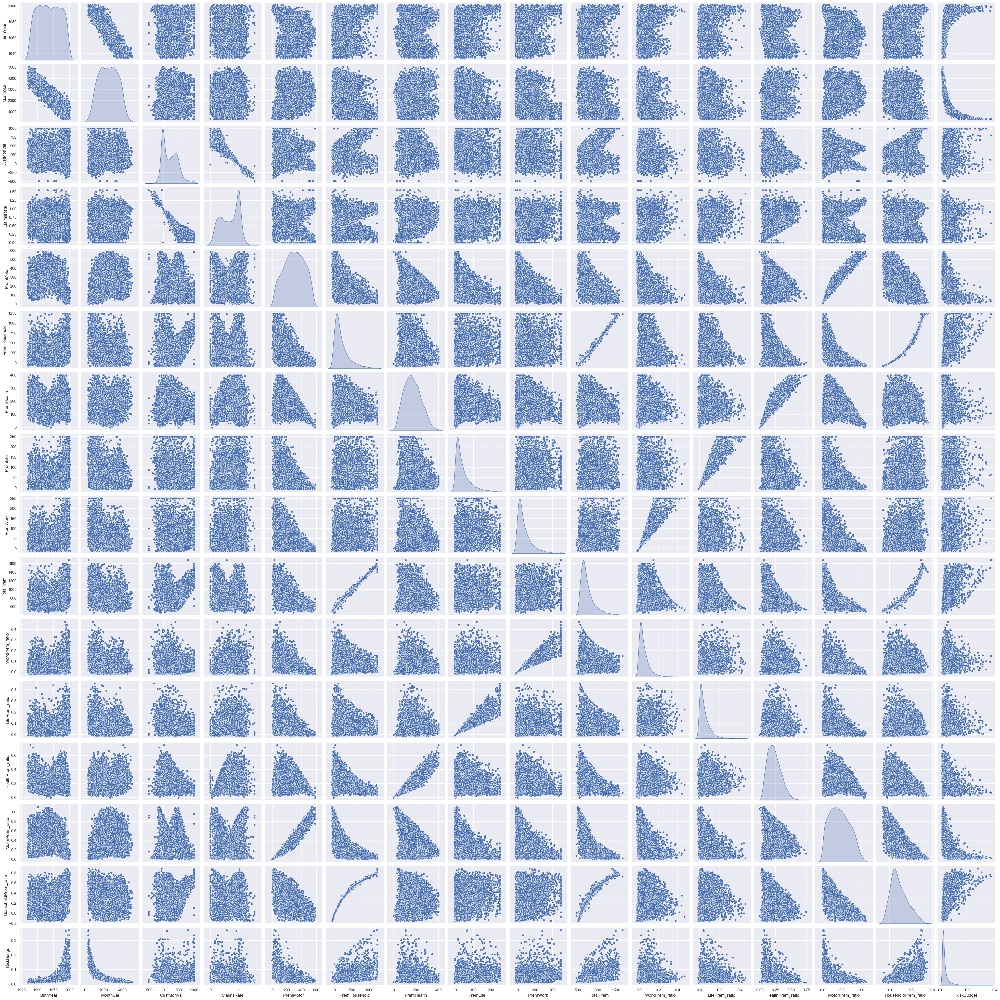

In [758]:
sns.pairplot(df_wo_out[numerical_col_list], diag_kind='kde')

In [759]:
get_high_correlated_columns(df_wo_out, 0.8, numerical_col_list)

,col1,count,unique
4,HouseholdPrem_ratio,3,"[PremHousehold, TotalPrem, MotorPrem_ratio]"
7,MotorPrem_ratio,2,"[PremMotor, HouseholdPrem_ratio]"
9,PremHousehold,2,"[TotalPrem, HouseholdPrem_ratio]"
13,TotalPrem,2,"[PremHousehold, HouseholdPrem_ratio]"
0,BirthYear,1,[MonthSal]
1,ClaimsRate,1,[CustMonVal]
2,CustMonVal,1,[ClaimsRate]
3,HealthPrem_ratio,1,[PremHealth]
5,LifePrem_ratio,1,[PremLife]
6,MonthSal,1,[BirthYear]


In [760]:
# Looks like that some premium columns are correlated with each other. We can combine them into a single column (based on their total amount).
df_wo_out_clean = df_wo_out.copy()

#Create a new feature: Household + Motor ratio (PIVOTED)
#df_wo_out_clean['HouseholdMotor_ratio'] = (df_wo_out_clean['PremHousehold'] + df_wo_out_clean['PremMotor']) / df_wo_out_clean['TotalPrem']
#df_wo_out_clean = df_wo_out_clean.drop(['HouseholdPrem_ratio', 'MotorPrem_ratio'], axis=1)

# Also, the premium ratio columns are all higly correlated with their respective total premium columns. We can drop the total premium columns.
df_wo_out_clean = df_wo_out_clean.drop(['PremWork', 'PremLife', 'PremHealth', 'PremMotor', 'PremHousehold'], axis=1)

#The  CustMonVal and ClaimsRate are both very correlated. We can drop the CustMonVal column since its more correlated with other features.
df_wo_out_clean = df_wo_out_clean.drop(['CustMonVal'], axis=1)

#BirthYear and MonthSal are also highly correlated. We can drop MonthSal since RiskBudget can give more insights and is not so correlated with BirthYear.  
#Also, RiskBudget and BirthYear will be used in different perspectives for clustering (BirthYear and MonthSal would be used in the same one)
df_wo_out_clean = df_wo_out_clean.drop(['MonthSal'], axis=1)

#Update the list of numerical and ordinal columns
numerical_col_list = numerical_col_list
numerical_col_list = [col for col in numerical_col_list if col not in [
    'PremWork', 'PremLife',
    'PremHealth', 'PremMotor',
    'PremHousehold','CustMonVal',
    'MonthSal']]
print("Numerical columns: ", numerical_col_list)
print("Ordinal columns: ", ordinal_col_list)
print("Categorical columns: ", categorical_col_list)
print("Final dataset shape", df_wo_out_clean.shape)

Numerical columns:  ['BirthYear', 'ClaimsRate', 'TotalPrem', 'WorkPrem_ratio', 'LifePrem_ratio', 'HealthPrem_ratio', 'MotorPrem_ratio', 'HouseholdPrem_ratio', 'RiskBudget']
Ordinal columns:  ['EducDeg', 'has_cancelled']
Categorical columns:  ['EducDeg', 'GeoLivArea', 'Children', 'has_cancelled']
Final dataset shape (10192, 13)


In [761]:
df_wo_out_clean.head()

,BirthYear,EducDeg,GeoLivArea,Children,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,has_cancelled
CustID,,,,,,,,,,,,,
1,1982,2,1,1,0.39,665.56,0.025377,0.070632,0.219905,0.564712,0.119373,0.025477,0
2,1995,2,4,1,1.12,910.96,0.116503,0.213489,0.128096,0.085031,0.456881,0.112132,0
3,1970,1,3,0,0.28,740.60,0.133702,0.116595,0.168215,0.278355,0.303133,0.027104,0
4,1981,3,4,1,0.99,600.68,0.047180,0.058833,0.518030,0.303789,0.072168,0.045547,0
5,1973,3,4,1,0.90,629.24,0.065873,0.029846,0.290175,0.538141,0.075965,0.029743,0


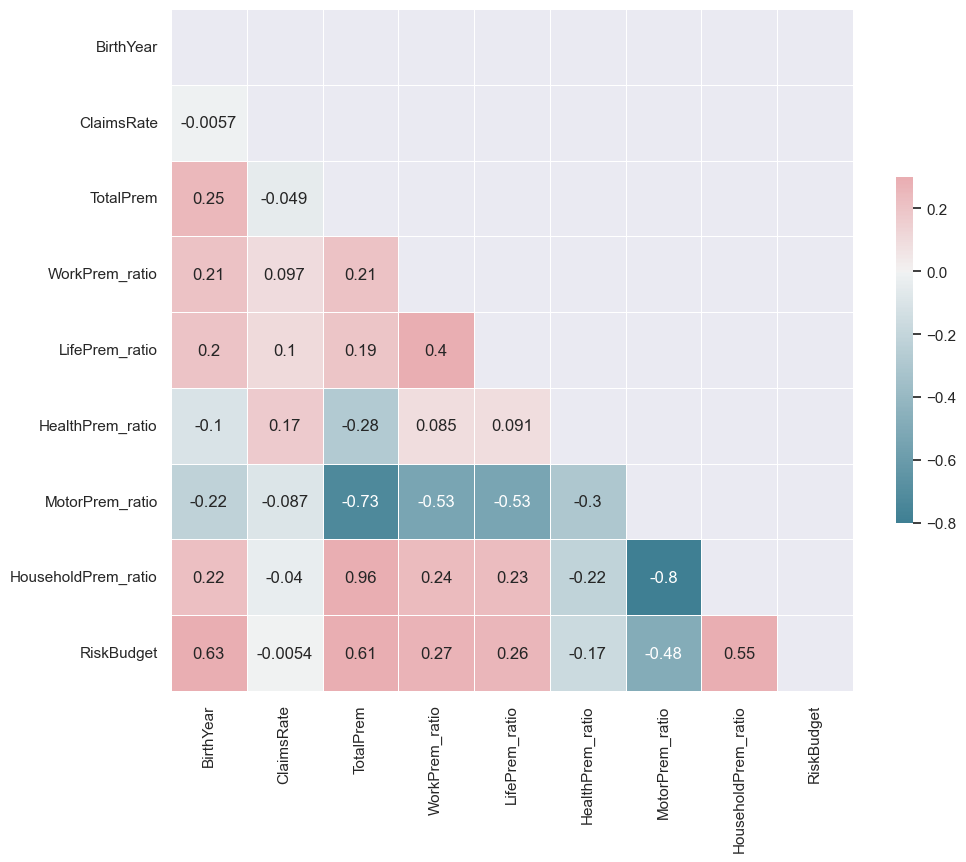

In [762]:
plot_correlation_heatmap(df_wo_out_clean, numerical_col_list)

### Categorical selection

### Area

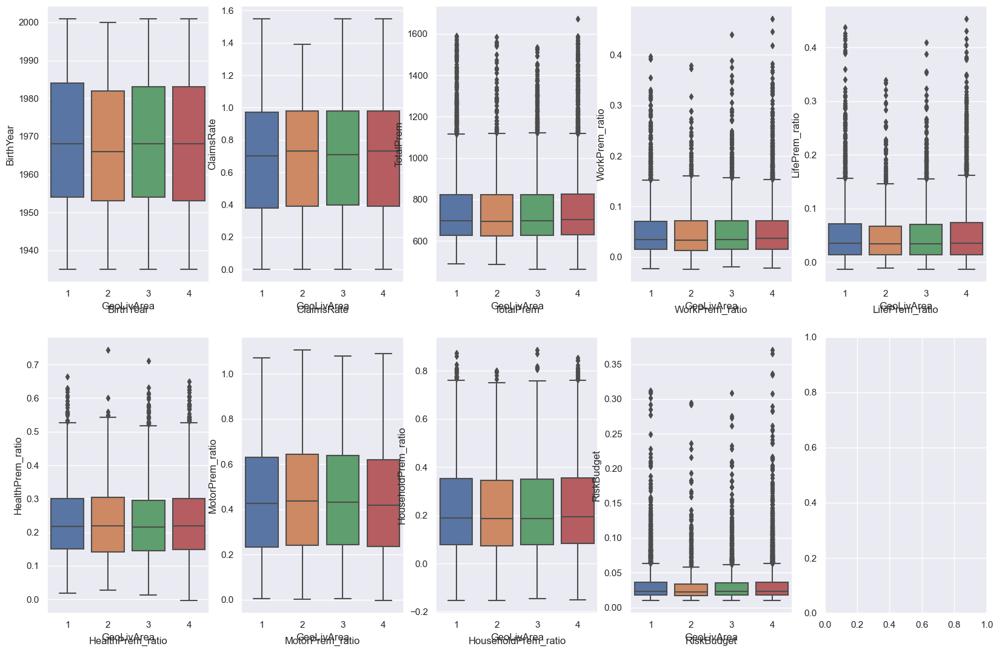

In [763]:
fig, axes = plt.subplots(2, int(np.ceil(len(numerical_col_list) / 2)), figsize=(20, 13))
	
# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), numerical_col_list): # Notice the zip() function and flatten() method
    # CODE HERE
    sns.boxplot(
        x = df_wo_out_clean['GeoLivArea'],
        y = df_wo_out_clean[feat],
        ax = ax)
    ax.set_title(feat,y=-.13)
	    

#### Children

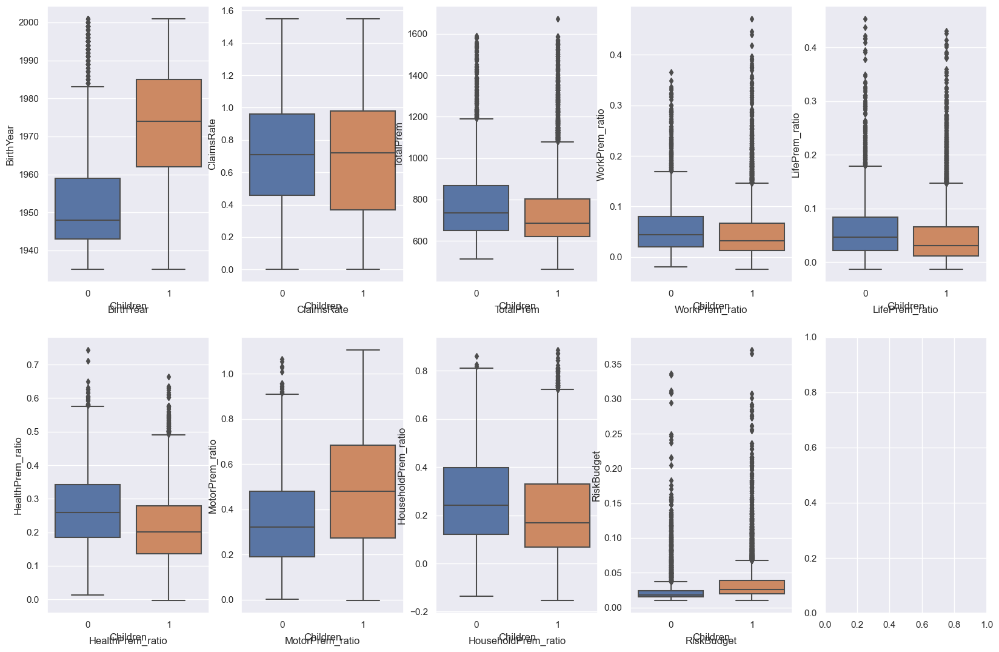

In [764]:
fig, axes = plt.subplots(2, int(np.ceil(len(numerical_col_list) / 2)), figsize=(20, 13))
	
# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), numerical_col_list): # Notice the zip() function and flatten() method
    # CODE HERE
    sns.boxplot(
        x = df_wo_out_clean['Children'],
        y = df_wo_out_clean[feat],
        ax = ax)
    ax.set_title(feat,y=-.13)
	    

#### Education

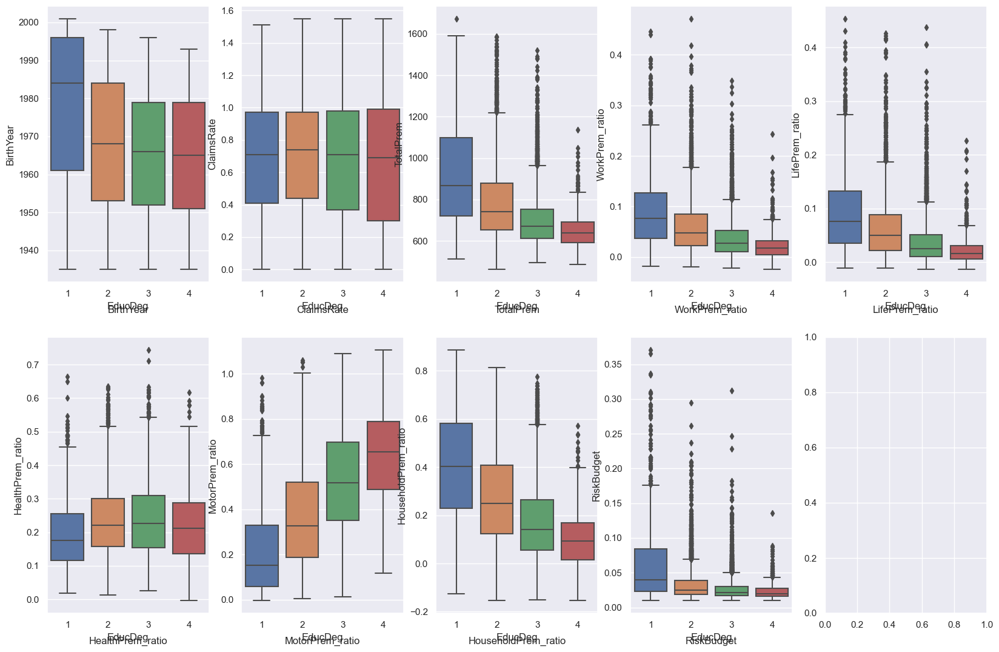

In [765]:
fig, axes = plt.subplots(2, int(np.ceil(len(numerical_col_list) / 2)), figsize=(20, 13))
	
# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), numerical_col_list): # Notice the zip() function and flatten() method
    # CODE HERE
    sns.boxplot(
        x = df_wo_out_clean['EducDeg'],
        y = df_wo_out_clean[feat],
        ax = ax)
    ax.set_title(feat,y=-.13)
	    

In [766]:
#Looks like Area variable is not very useful. It does not provide any kind of discrimination on the numerical values. We can drop it.
df_wo_out_clean = df_wo_out_clean.drop(['GeoLivArea'], axis=1)
#Update the list of the categorical columns
categorical_col_list = [col for col in categorical_col_list if col not in ['GeoLivArea']]

print("Numerical columns: ", numerical_col_list)
print("Ordinal columns: ", ordinal_col_list)
print("Categorical columns: ", categorical_col_list)
print("Final dataset shape", df_wo_out_clean.shape)

Numerical columns:  ['BirthYear', 'ClaimsRate', 'TotalPrem', 'WorkPrem_ratio', 'LifePrem_ratio', 'HealthPrem_ratio', 'MotorPrem_ratio', 'HouseholdPrem_ratio', 'RiskBudget']
Ordinal columns:  ['EducDeg', 'has_cancelled']
Categorical columns:  ['EducDeg', 'Children', 'has_cancelled']
Final dataset shape (10192, 12)


## Final Data

In [890]:
# Data transformation

#Separate customers dataset into active and inactive (churn)
df_final_churn = df_wo_out_clean[df_wo_out_clean['has_cancelled'] == 1].copy()
df_final_active = df_wo_out_clean[df_wo_out_clean['has_cancelled'] == 0].copy()

#Pipeline to transform features
transform_pipeline = Pipeline([
    ('preprocessor', ColumnTransformer([
                                        #('onehot', OneHotEncoder(handle_unknown='ignore'), categorical_col_list),
                                        ('scaller', MinMaxScaler(), numerical_col_list)
                                        ], remainder='passthrough'))
    ])

# Transform the features
df_final_active = transform_pipeline.fit_transform(df_final_active)

# Convert the transformed features to a dataframe
df_final_active = pd.DataFrame(df_final_active, columns=numerical_col_list + categorical_col_list)

#Put the categorical EducDeg in the same order as the numerical columns (between 0 and 1)
df_final_active['EducDeg'] = df_final_active['EducDeg'] / 4
df_final_active.head()

# With ohe 
#columns = list(transform_pipeline.named_steps['preprocessor'].transformers_[0][1].get_feature_names_out())
#columns = columns + numerical_col_list
# columns = numerical_col_list
# df_final = pd.DataFrame(df_final, columns=columns)
# df_final.drop(['has_cancelled_0','Children_0'], axis=1, inplace=True)
# df_final = df_final.rename(columns = {
#     'has_cancelled_1': 'has_cancelled',
#     'Children_1': 'Children'
# })

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0


In [833]:
df_wo_out_clean.head()

,BirthYear,EducDeg,Children,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,has_cancelled
CustID,,,,,,,,,,,,
1,1982,2,1,0.39,665.56,0.025377,0.070632,0.219905,0.564712,0.119373,0.025477,0
2,1995,2,1,1.12,910.96,0.116503,0.213489,0.128096,0.085031,0.456881,0.112132,0
3,1970,1,0,0.28,740.60,0.133702,0.116595,0.168215,0.278355,0.303133,0.027104,0
4,1981,3,1,0.99,600.68,0.047180,0.058833,0.518030,0.303789,0.072168,0.045547,0
5,1973,3,1,0.90,629.24,0.065873,0.029846,0.290175,0.538141,0.075965,0.029743,0


In [834]:
df_final_active.head()

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0


In [835]:
df_final_churn.head()

,BirthYear,EducDeg,Children,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,has_cancelled
CustID,,,,,,,,,,,,
15,1975,2,1,1.12,535.00,0.031570,0.020355,0.136056,0.942860,-0.130841,0.022505,1
16,1979,3,1,0.53,676.12,0.029092,-0.004437,0.366044,0.470419,0.138881,0.057847,1
27,1937,4,0,0.38,740.24,0.030774,-0.006755,0.309116,0.446936,0.219929,0.014409,1
29,1952,3,0,0.50,574.12,-0.000192,-0.006967,0.449470,0.524768,0.032920,0.013147,1
30,1972,3,0,0.96,606.11,-0.008249,0.011549,0.090578,0.864876,0.041247,0.018988,1


# Models

In [836]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

def plot_dendogram(hierarchical_cluster,y_threshold,df) :

    # Adapted from:
    # https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(hierarchical_cluster.children_.shape[0])
    n_samples = len(hierarchical_cluster.labels_)

    # hierarchical_cluster.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(hierarchical_cluster.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the hierarchical_cluster.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the hierarchical_cluster.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack(
        [hierarchical_cluster.children_, hierarchical_cluster.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=(11,5))
    # The Dendrogram parameters need to be tuned
    dendrogram(linkage_matrix, truncate_mode='level', labels=df.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering Wards\'s Dendrogram', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'Euclidean Distance', fontsize=13)
    plt.show()

def plot_knn_distances(df,metric_features,n):
    # K-distance graph to find out the right eps value
    neigh = NearestNeighbors(n_neighbors=n)
    neigh.fit(df[metric_features])
    distances, _ = neigh.kneighbors(df[metric_features])
    distances = np.sort(distances[:, -1])
    plt.plot(distances)
    plt.show()

## Clustering by perspectives

In [838]:
print("Numerical columns: ", numerical_col_list)
print("Categorical columns: ", categorical_col_list)
print("Final active dataset shape", df_final_active.shape)
print("Final churn dataset shape", df_final_churn.shape)

Numerical columns:  ['BirthYear', 'ClaimsRate', 'TotalPrem', 'WorkPrem_ratio', 'LifePrem_ratio', 'HealthPrem_ratio', 'MotorPrem_ratio', 'HouseholdPrem_ratio', 'RiskBudget']
Categorical columns:  ['EducDeg', 'Children', 'has_cancelled']
Final active dataset shape (7973, 12)
Final churn dataset shape (2219, 12)


In [839]:
preferences_cluster_var = [
    'WorkPrem_ratio',
    'LifePrem_ratio',
    'HealthPrem_ratio',
    'HouseholdPrem_ratio',
    'MotorPrem_ratio'  
]
demographic_cluster_var = [
    'BirthYear',
    'EducDeg',
    'Children'
]
value_cluster_var = [
    'RiskBudget',
    'ClaimsRate',
    'TotalPrem'
]

print("#Preferences cluster variables: ", len(preferences_cluster_var))
print("#Demographic cluster variables: ", len(demographic_cluster_var))
print("#Customer cluster variables: ", len(value_cluster_var))
print('Total number of variables to cluster:', len(preferences_cluster_var) + len(demographic_cluster_var) + len(value_cluster_var))

print("Churned customers: ", df_final_churn.shape)
print("Active customers: ", df_final_active.shape)

#Preferences cluster variables:  5
#Demographic cluster variables:  3
#Customer cluster variables:  3
Total number of variables to cluster: 11
Churned customers:  (2219, 12)
Active customers:  (7973, 12)


## Active clusters segmentation

### Preferences Cluster

#### Kmeans + HC

Approach : 

- Use kmeans to cluster with a large number of cluster
- Merge the resulted clusters with Hierarchical Clustering
- Porfiling

In [840]:
# Initialize alghorithms

kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42,
    n_clusters= 50
)
hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [841]:
full_labels = kmeans.fit_predict(df_final_active[preferences_cluster_var])
df_final_active['aggresive_cluster'] = full_labels
df_preferences_active = df_final_active\
        .groupby('aggresive_cluster')\
        [preferences_cluster_var].mean()
df_preferences_active

,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,HouseholdPrem_ratio,MotorPrem_ratio
aggresive_cluster,,,,,
0,0.068848,0.054500,0.261404,0.277623,0.512087
1,0.218981,0.090155,0.165541,0.585460,0.211625
2,0.086007,0.233575,0.381312,0.439313,0.177159
3,0.063184,0.058205,0.270385,0.169613,0.606621
4,0.082059,0.068202,0.548501,0.072599,0.471370
5,0.324506,0.776194,0.312611,0.173637,0.107363
6,0.084113,0.098197,0.154493,0.383464,0.467186
7,0.132121,0.206356,0.251668,0.621855,0.097504
8,0.149486,0.226506,0.396712,0.264064,0.302164


In [842]:
# Merging kmeans with HC
hierarchical_merging = hierarchical.set_params(
    linkage='ward',
    distance_threshold=0, 
    n_clusters=None)
hmerged_labels = hierarchical_merging.fit_predict(df_preferences_active)

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


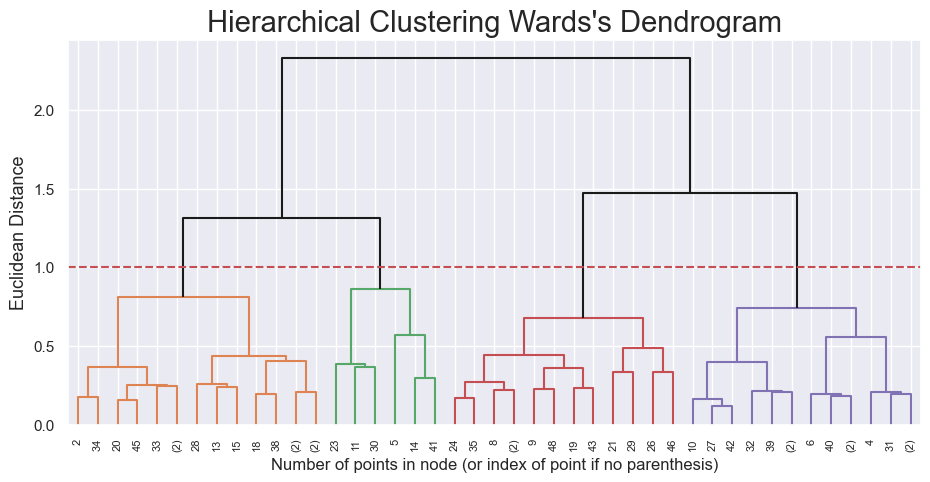

In [843]:
plot_dendogram(hierarchical_merging, 1,df_preferences_active)

In [844]:
#Final merge solution
hierarchical_final = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hfinal_labels = hierarchical_final.fit_predict(df_preferences_active)
df_preferences_active['preference_cluster'] = hfinal_labels
df_preferences_active

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,HouseholdPrem_ratio,MotorPrem_ratio,preference_cluster
aggresive_cluster,,,,,,
0,0.068848,0.054500,0.261404,0.277623,0.512087,3
1,0.218981,0.090155,0.165541,0.585460,0.211625,1
2,0.086007,0.233575,0.381312,0.439313,0.177159,1
3,0.063184,0.058205,0.270385,0.169613,0.606621,3
4,0.082059,0.068202,0.548501,0.072599,0.471370,3
5,0.324506,0.776194,0.312611,0.173637,0.107363,0
6,0.084113,0.098197,0.154493,0.383464,0.467186,3
7,0.132121,0.206356,0.251668,0.621855,0.097504,1
8,0.149486,0.226506,0.396712,0.264064,0.302164,2


In [845]:
# Mapping the clusters to the original dataset

df_final_active['preference_cluster'] = df_final_active['aggresive_cluster'].map(
    dict(zip(df_preferences_active.index, df_preferences_active['preference_cluster']))
)
df_final_active.drop('aggresive_cluster', axis=1, inplace=True)
df_final_active.head() 

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled,preference_cluster
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0,3
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0,0
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0,1
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0,2
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0,3


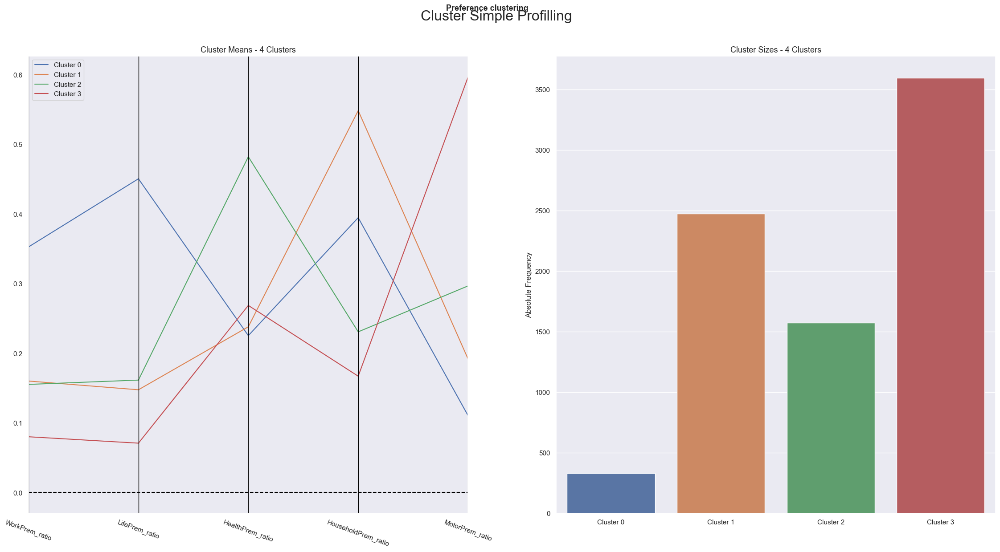

In [846]:
# Profile the clusters

cluster_profiles(
    df = df_final_active[preferences_cluster_var + ['preference_cluster']], 
    label_columns = ['preference_cluster'],
    figsize = (28, 13), 
    compar_titles = ["Preference clustering"]
)

##### R2

In [847]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_final_active[preferences_cluster_var])  # get total sum of squares
ssw_labels = df_final_active[preferences_cluster_var + ['preference_cluster']].groupby(by='preference_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5809


#### DBSCAN

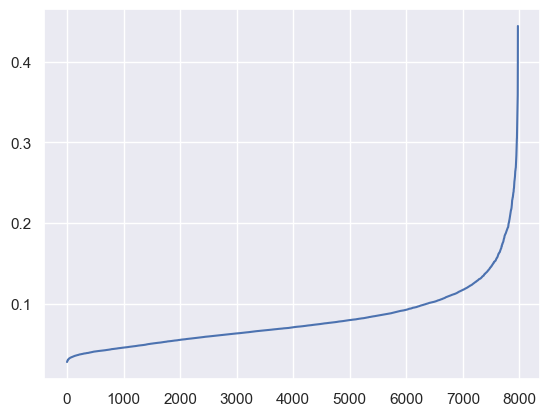

In [848]:
plot_knn_distances(df_final_active, preferences_cluster_var, 20)

In [849]:
MinPts = 2 * len(preferences_cluster_var) + 1
eps = 0.15

dbscan = DBSCAN(eps=eps, min_samples=MinPts)
dbscal_labels = dbscan.fit_predict(df_final_active[preferences_cluster_var])
df_final_active['dbscan_preference_cluster'] = dbscal_labels

print("MinPts: ", MinPts)
print("Epsilon: ", eps)
print("Number of clusters: ", df_final_active['dbscan_preference_cluster'].value_counts())


MinPts:  11
Epsilon:  0.15
Number of clusters:   0    7844
-1     129
Name: dbscan_preference_cluster, dtype: int64


##### R2

In [850]:
# Computing the R^2 of the cluster solution
df_nonoise = df_final_active[df_final_active['dbscan_preference_cluster'] != -1]
sst = get_ss(df_nonoise[preferences_cluster_var])  # get total sum of squares
ssw_labels = df_nonoise[preferences_cluster_var + ['dbscan_preference_cluster']].groupby(by='dbscan_preference_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0000


### Value Cluster

#### Kmeans + HC

Approach : 

- Use Kmeans to cluster with a large number of cluster
- Merge the resulted clusters with Hierarchical Clustering
- Porfiling

In [851]:
full_labels = kmeans.fit_predict(df_final_active[value_cluster_var])
df_final_active['aggresive_cluster'] = full_labels
df_value_active = df_final_active\
        .groupby('aggresive_cluster')\
        [value_cluster_var].mean()
df_value_active

,RiskBudget,ClaimsRate,TotalPrem
aggresive_cluster,,,
0,0.148696,0.643099,0.234078
1,0.183955,0.285668,0.559947
2,0.058528,0.305080,0.244025
3,0.050521,0.661065,0.331514
4,0.155010,0.702366,0.555083
5,0.050519,0.133468,0.251856
6,0.037653,0.536399,0.192602
7,0.300638,0.128111,0.838648
8,0.058927,0.288769,0.462641


In [852]:
# Merging kmeans with HC
hierarchical_merging = hierarchical.set_params(
    linkage='ward',
    distance_threshold=0, 
    n_clusters=None)
hmerged_labels = hierarchical_merging.fit_predict(df_value_active)

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


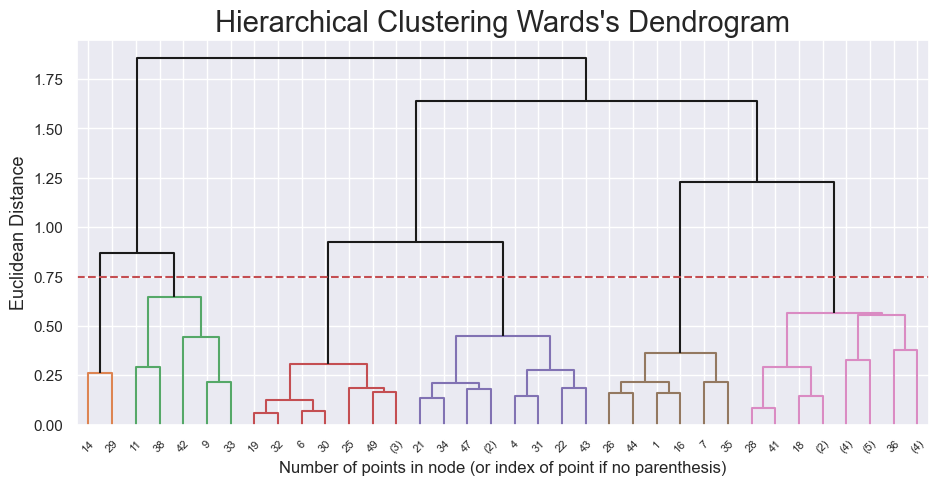

In [854]:
plot_dendogram(hierarchical_merging, .75,df_value_active)

In [855]:
#Final merge solution
hierarchical_final = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=6
)
hfinal_labels = hierarchical_final.fit_predict(df_value_active)
df_value_active['value_cluster'] = hfinal_labels
df_value_active

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


,RiskBudget,ClaimsRate,TotalPrem,value_cluster
aggresive_cluster,,,,
0,0.148696,0.643099,0.234078,4
1,0.183955,0.285668,0.559947,3
2,0.058528,0.305080,0.244025,2
3,0.050521,0.661065,0.331514,4
4,0.155010,0.702366,0.555083,1
5,0.050519,0.133468,0.251856,2
6,0.037653,0.536399,0.192602,4
7,0.300638,0.128111,0.838648,3
8,0.058927,0.288769,0.462641,2


In [856]:
# Mapping the clusters to the original dataset

df_final_active['value_cluster'] = df_final_active['aggresive_cluster'].map(
    dict(zip(df_value_active.index, df_value_active['value_cluster']))
)
df_final_active.drop('aggresive_cluster', axis=1, inplace=True)
df_final_active.head() 

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled,preference_cluster,dbscan_preference_cluster,value_cluster
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0,3,0,2
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0,0,0,1
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0,1,0,2
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0,2,0,4
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0,3,0,4


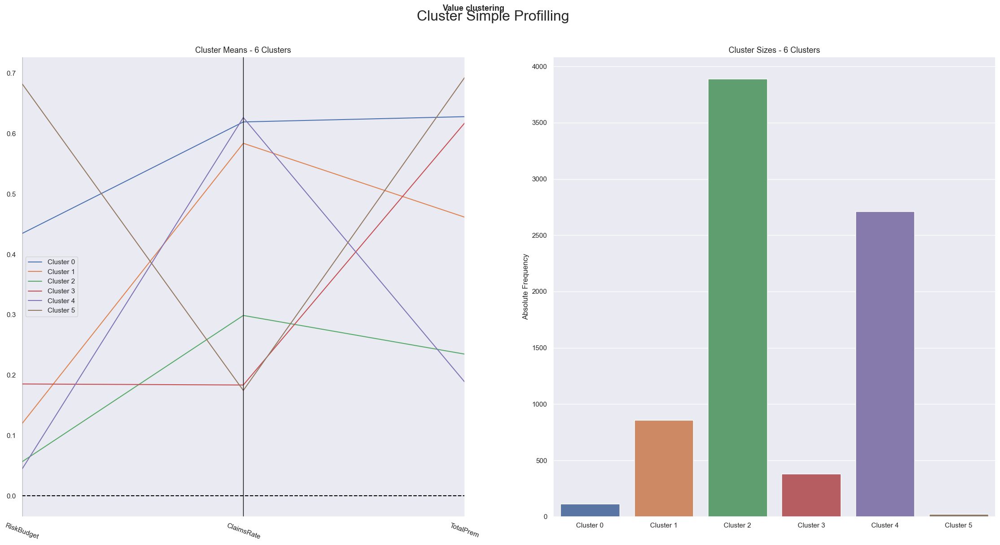

In [857]:
# Profile the clusters

cluster_profiles(
    df = df_final_active[value_cluster_var + ['value_cluster']], 
    label_columns = ['value_cluster'],
    figsize = (28, 13), 
    compar_titles = ["Value clustering"]
)

##### R2

In [858]:
df_final_active.columns

Index(['BirthYear', 'ClaimsRate', 'TotalPrem', 'WorkPrem_ratio',
       'LifePrem_ratio', 'HealthPrem_ratio', 'MotorPrem_ratio',
       'HouseholdPrem_ratio', 'RiskBudget', 'EducDeg', 'Children',
       'has_cancelled', 'preference_cluster', 'dbscan_preference_cluster',
       'value_cluster'],
      dtype='object')

In [859]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_final_active[value_cluster_var])  # get total sum of squares
ssw_labels = df_final_active[value_cluster_var + ['value_cluster']].groupby(by='value_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.6804


#### DBSCAN

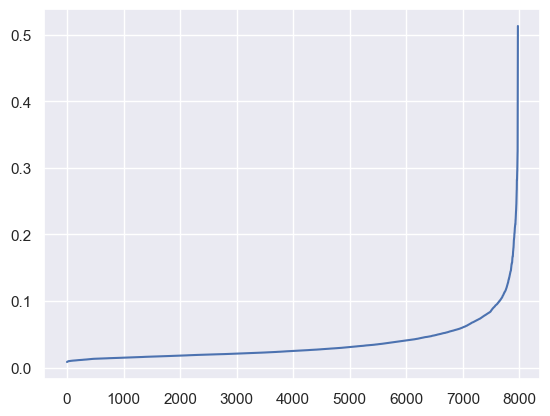

In [860]:
plot_knn_distances(df_final_active, value_cluster_var, 20)

In [861]:
MinPts = 2 * len(value_cluster_var) + 1
eps = 0.1

dbscan = DBSCAN(eps=eps, min_samples=MinPts)
dbscal_labels = dbscan.fit_predict(df_final_active[value_cluster_var])
df_final_active['dbscan_value_cluster'] = dbscal_labels

print("MinPts: ", MinPts)
print("Epsilon: ", eps)
print("Number of clusters: ", df_final_active['dbscan_value_cluster'].value_counts())


MinPts:  7
Epsilon:  0.1
Number of clusters:   0    7885
-1      88
Name: dbscan_value_cluster, dtype: int64


##### R2

In [862]:
# Computing the R^2 of the cluster solution
df_nonoise = df_final_active[df_final_active['dbscan_value_cluster'] != -1]
sst = get_ss(df_nonoise[value_cluster_var])  # get total sum of squares
ssw_labels = df_nonoise[value_cluster_var + ['dbscan_value_cluster']].groupby(by='dbscan_value_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0000


### Demographic Cluster

#### Kprotypes + HC

Approach : 

- Use KPrototype (to account for categorical and numerical features) to cluster with a large number of cluster
- Merge the resulted clusters with Hierarchical Clustering
- Porfiling

In [863]:
df_final_active[demographic_cluster_var]

,BirthYear,EducDeg,Children
0,0.712121,0.50,1.0
1,0.909091,0.50,1.0
2,0.530303,0.25,0.0
3,0.696970,0.75,1.0
4,0.575758,0.75,1.0
...,...,...,...
7968,0.212121,1.00,0.0
7969,0.257576,0.25,0.0
7970,0.621212,0.75,1.0
7971,0.636364,0.25,1.0


In [864]:
# Initialize alghorithms

kprototype = KPrototypes(
    n_jobs = -1,
    n_clusters = 20,
    init = 'Huang',
    random_state = 42)


catColumnsPos = [df_final_active[demographic_cluster_var].columns.get_loc(col) for col in ['EducDeg','Children']]
dfMatrix = df_final_active[demographic_cluster_var].to_numpy()
# kprototype.fit_predict(dfMatrix, categorical = catColumnsPos)

In [865]:
full_labels = kprototype.fit_predict(dfMatrix, categorical = catColumnsPos)
df_final_active['aggresive_cluster'] = full_labels
df_demographic_active = df_final_active\
        .groupby('aggresive_cluster')\
        [demographic_cluster_var].mean()
df_demographic_active

,BirthYear,EducDeg,Children
aggresive_cluster,,,
0,0.177362,1.000000,0.066176
1,0.778034,0.750000,1.000000
2,0.897436,0.250000,0.000000
3,0.918759,0.250000,1.000000
4,0.124435,0.750000,0.000000
5,0.191541,0.250000,0.000000
6,0.666744,0.250000,1.000000
7,0.315412,0.500000,1.000000
8,0.304269,0.750000,1.000000


In [869]:
df_final_active['aggresive_cluster'] = full_labels
df_demographic_active = df_final_active\
        .groupby('aggresive_cluster')\
        [demographic_cluster_var].mean()
df_demographic_active

,BirthYear,EducDeg,Children
aggresive_cluster,,,
0,0.177362,1.000000,0.066176
1,0.778034,0.750000,1.000000
2,0.897436,0.250000,0.000000
3,0.918759,0.250000,1.000000
4,0.124435,0.750000,0.000000
5,0.191541,0.250000,0.000000
6,0.666744,0.250000,1.000000
7,0.315412,0.500000,1.000000
8,0.304269,0.750000,1.000000


In [870]:
# Merging kmeans with HC
hierarchical_merging = hierarchical.set_params(
    linkage='ward',
    distance_threshold=0, 
    n_clusters=None)
hmerged_labels = hierarchical_merging.fit_predict(df_demographic_active)

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


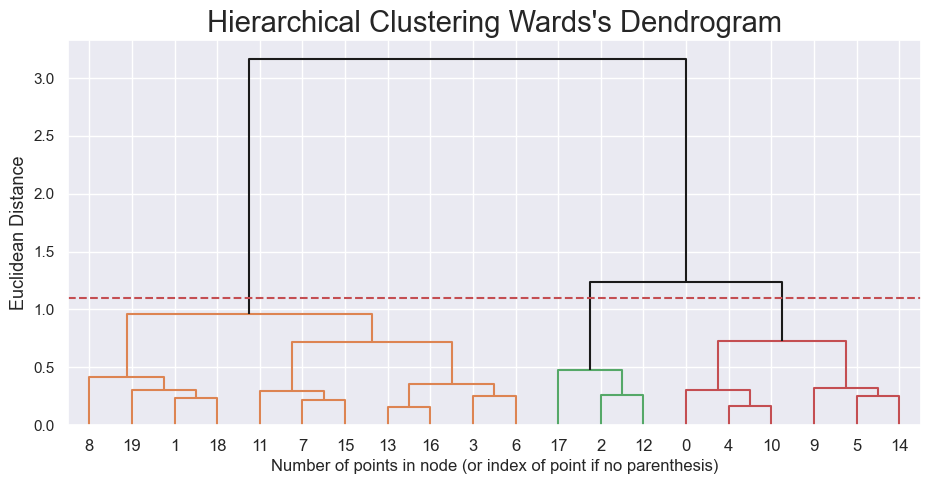

In [871]:
plot_dendogram(hierarchical_merging,1.1,df_demographic_active)

In [872]:
#Final merge solution
hierarchical_final = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=3
)
hfinal_labels = hierarchical_final.fit_predict(df_demographic_active)
df_demographic_active['demographic_cluster'] = hfinal_labels
df_demographic_active

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


,BirthYear,EducDeg,Children,demographic_cluster
aggresive_cluster,,,,
0,0.177362,1.000000,0.066176,1
1,0.778034,0.750000,1.000000,0
2,0.897436,0.250000,0.000000,2
3,0.918759,0.250000,1.000000,0
4,0.124435,0.750000,0.000000,1
5,0.191541,0.250000,0.000000,1
6,0.666744,0.250000,1.000000,0
7,0.315412,0.500000,1.000000,0
8,0.304269,0.750000,1.000000,0


In [873]:
# Mapping the clusters to the original dataset

df_final_active['demographic_cluster'] = df_final_active['aggresive_cluster'].map(
    dict(zip(df_demographic_active.index, df_demographic_active['demographic_cluster']))
)
df_final_active.drop('aggresive_cluster', axis=1, inplace=True)
df_final_active.head() 

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled,preference_cluster,dbscan_preference_cluster,value_cluster,dbscan_value_cluster,demographic_cluster
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0,3,0,2,0,0
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0,0,0,1,0,0
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0,1,0,2,0,1
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0,2,0,4,0,0
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0,3,0,4,0,0


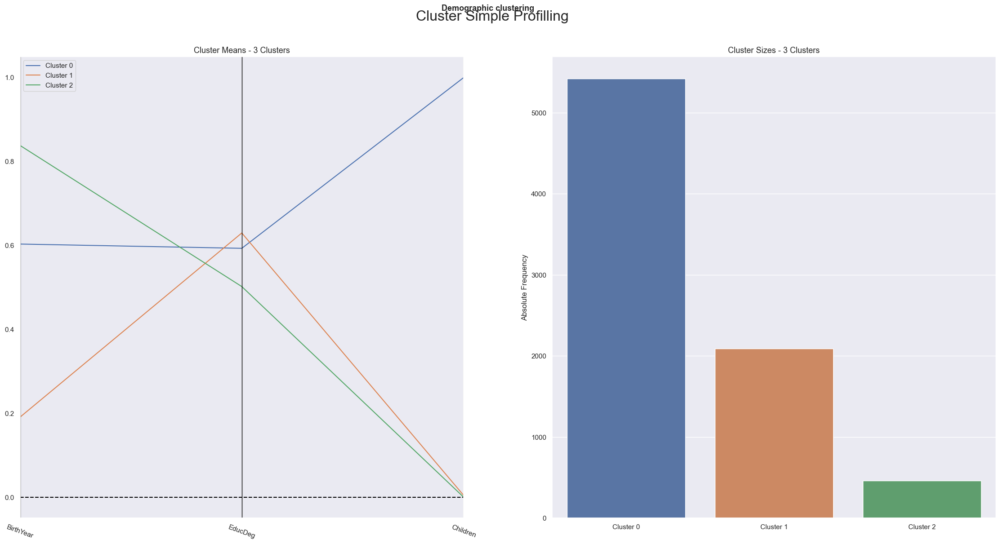

In [874]:
# Profile the clusters

cluster_profiles(
    df = df_final_active[demographic_cluster_var + ['demographic_cluster']], 
    label_columns = ['demographic_cluster'],
    figsize = (28, 13), 
    compar_titles = ["Demographic clustering"]
)

##### R2

In [875]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_final_active[demographic_cluster_var])  # get total sum of squares
ssw_labels = df_final_active[demographic_cluster_var + ['demographic_cluster']].groupby(by='demographic_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.7666


### Final merged clusters

In [876]:
df_final_active.head()

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled,preference_cluster,dbscan_preference_cluster,value_cluster,dbscan_value_cluster,demographic_cluster
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0,3,0,2,0,0
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0,0,0,1,0,0
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0,1,0,2,0,1
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0,2,0,4,0,0
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0,3,0,4,0,0


In [877]:

merged_df = df_final_active.groupby(['value_cluster','preference_cluster','demographic_cluster'])\
    [preferences_cluster_var + value_cluster_var + demographic_cluster_var].mean()

merged_df

WorkPrem_ratio  \
value_cluster preference_cluster demographic_cluster                   
0             0                  0                          0.448777   
                                 2                          0.533625   
              1                  0                          0.173229   
                                 2                          0.196313   
              2                  0                          0.120967   
              3                  0                          0.057422   
1             0                  0                          0.217886   
                                 1                          0.095912   
                                 2                          0.211491   
              1                  0                          0.168862   
                                 1                          0.140234   
                                 2                          0.198121   
              2                  0                          0.140969   
                                 1                          0.102355   
                                 2                          0.073745   
              3                  0                          0.135113   
                                 1                          0.063266   
2             0                  0                          0.375952   
                                 1                          0.312386   
                                 2                          0.392318   
              1                  0                          0.155293   
                                 1                          0.137651   
                                 2                          0.181001   
              2                  0                          0.148429   
                                 1                          0.132994   
                                 2                          0.233730   
              3                  0                          0.078457   
                                 1                          0.090353   
                                 2                          0.110078   
3             0                  0                          0.143153   
                                 2                          0.062176   
              1                  0                          0.164118   
                                 1                          0.120899   
                                 2                          0.197530   
4             0                  0                          0.472705   
                                 1                          0.466607   
                                 2                          0.430470   
              1                  0                          0.169494   
                                 1                          0.133294   
                                 2                          0.247865   
              2                  0                          0.182841   
                                 1                          0.148401   
                                 2                          0.208980   
              3                  0                          0.076771   
                                 1                          0.082174   
                                 2                          0.085595   
5             1                  0                          0.193610   
                                 2                          0.187442   

                                                      LifePrem_ratio  \
value_cluster preference_cluster demographic_cluster                   
0             0                  0                          0.434915   
                                 2                          0.444535   
              1                  0                          0.175955   
                                 2                          0.151280   
              2      

In [878]:
# Merging kmeans with HC
hierarchical_merging = hierarchical.set_params(
    linkage='ward',
    distance_threshold=0, 
    n_clusters=None)
hmerged_labels = hierarchical_merging.fit_predict(merged_df)

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


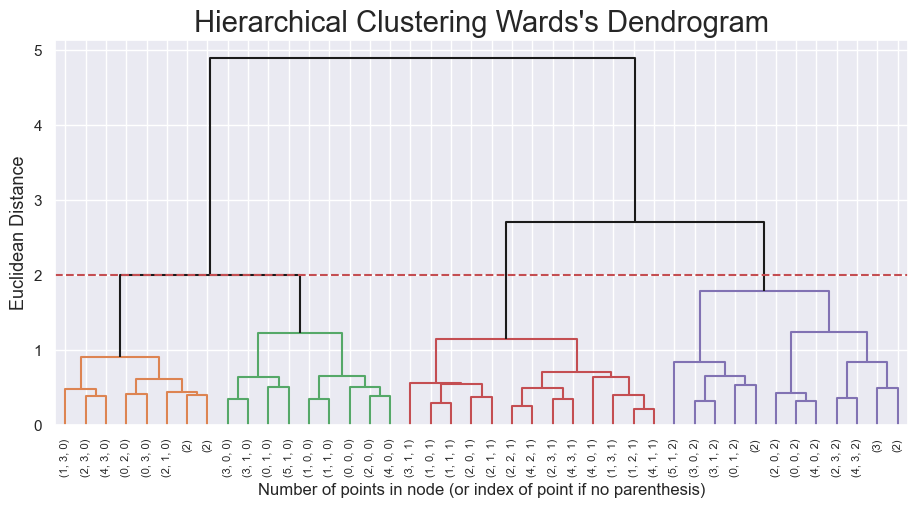

In [879]:
plot_dendogram(hierarchical_merging,2,merged_df)

In [880]:
#Final merge solution
hierarchical_final = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=5
)
hfinal_labels = hierarchical_final.fit_predict(merged_df)
merged_df['merged_cluster'] = hfinal_labels
merged_df

/Users/maxwell.marcos/.local/share/virtualenvs/DataMiningHMW--A2ZInsurance-Q8MtYL1P/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


WorkPrem_ratio  \
value_cluster preference_cluster demographic_cluster                   
0             0                  0                          0.448777   
                                 2                          0.533625   
              1                  0                          0.173229   
                                 2                          0.196313   
              2                  0                          0.120967   
              3                  0                          0.057422   
1             0                  0                          0.217886   
                                 1                          0.095912   
                                 2                          0.211491   
              1                  0                          0.168862   
                                 1                          0.140234   
                                 2                          0.198121   
              2                  0                          0.140969   
                                 1                          0.102355   
                                 2                          0.073745   
              3                  0                          0.135113   
                                 1                          0.063266   
2             0                  0                          0.375952   
                                 1                          0.312386   
                                 2                          0.392318   
              1                  0                          0.155293   
                                 1                          0.137651   
                                 2                          0.181001   
              2                  0                          0.148429   
                                 1                          0.132994   
                                 2                          0.233730   
              3                  0                          0.078457   
                                 1                          0.090353   
                                 2                          0.110078   
3             0                  0                          0.143153   
                                 2                          0.062176   
              1                  0                          0.164118   
                                 1                          0.120899   
                                 2                          0.197530   
4             0                  0                          0.472705   
                                 1                          0.466607   
                                 2                          0.430470   
              1                  0                          0.169494   
                                 1                          0.133294   
                                 2                          0.247865   
              2                  0                          0.182841   
                                 1                          0.148401   
                                 2                          0.208980   
              3                  0                          0.076771   
                                 1                          0.082174   
                                 2                          0.085595   
5             1                  0                          0.193610   
                                 2                          0.187442   

                                                      LifePrem_ratio  \
value_cluster preference_cluster demographic_cluster                   
0             0                  0                          0.434915   
                                 2                          0.444535   
              1                  0                          0.175955   
                                 2                          0.151280   
              2      

In [881]:
# Mapping the clusters to the original dataset
merged_cluster_mapping = merged_df['merged_cluster'].to_dict()

df_final_active['merged_cluster'] = df_final_active.apply(
    lambda x: merged_cluster_mapping[(x['value_cluster'],x['preference_cluster'],x['demographic_cluster'])], axis=1
)

df_final_active.head() 

,BirthYear,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,EducDeg,Children,has_cancelled,preference_cluster,dbscan_preference_cluster,value_cluster,dbscan_value_cluster,demographic_cluster,merged_cluster
0,0.712121,0.251613,0.166906,0.056260,0.154209,0.277831,0.591103,0.134632,0.043259,0.50,1.0,0.0,3,0,2,0,0,3
1,0.909091,0.722581,0.369753,0.260859,0.469641,0.151414,0.087770,0.515282,0.283285,0.50,1.0,0.0,0,0,1,0,0,1
2,0.530303,0.180645,0.228934,0.299475,0.255695,0.206656,0.290627,0.341881,0.047767,0.25,0.0,0.0,1,0,2,0,1,2
3,0.696970,0.638710,0.113277,0.105212,0.128157,0.688336,0.317314,0.081393,0.098852,0.75,1.0,0.0,2,0,4,0,0,3
4,0.575758,0.580645,0.136884,0.147183,0.064151,0.374591,0.563222,0.085675,0.055075,0.75,1.0,0.0,3,0,4,0,0,3


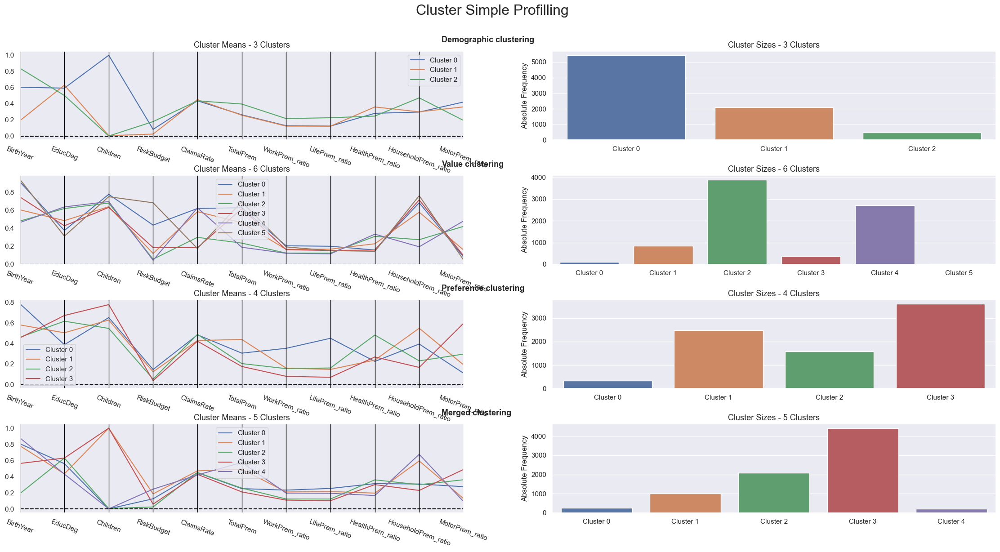

In [882]:
# Profile the clusters

cluster_profiles(
    df = df_final_active[demographic_cluster_var + value_cluster_var + preferences_cluster_var + ['merged_cluster','demographic_cluster','value_cluster','preference_cluster']], 
    label_columns = ['demographic_cluster','value_cluster','preference_cluster','merged_cluster'],
    figsize = (28, 13), 
    compar_titles = ["Demographic clustering","Value clustering","Preference clustering","Merged clustering"]
)

##### R2

In [883]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_final_active[value_cluster_var + demographic_cluster_var + preferences_cluster_var])  # get total sum of squares
ssw_labels = df_final_active[value_cluster_var + demographic_cluster_var + preferences_cluster_var + ['merged_cluster']].groupby(by='merged_cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5867


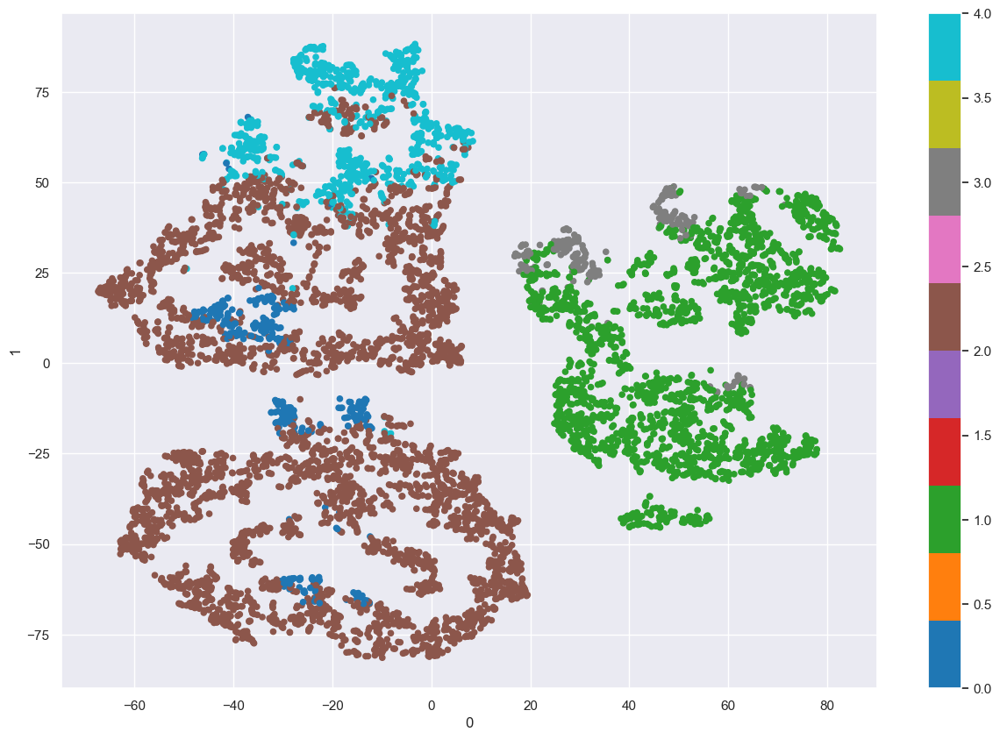

In [821]:
# t-SNE visualization

perplexities = 50
two_dim = TSNE(random_state=42,perplexity=perplexity).fit_transform(df_final_active[preferences_cluster_var + value_cluster_var + demographic_cluster_var])
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_final_active['merged_cluster'], colormap='tab10', figsize=(15,10))
plt.show()

## Inactive clusters segmentation

In [891]:
df_final_churn.head()

,BirthYear,EducDeg,Children,ClaimsRate,TotalPrem,WorkPrem_ratio,LifePrem_ratio,HealthPrem_ratio,MotorPrem_ratio,HouseholdPrem_ratio,RiskBudget,has_cancelled
CustID,,,,,,,,,,,,
15,1975,2,1,1.12,535.00,0.031570,0.020355,0.136056,0.942860,-0.130841,0.022505,1
16,1979,3,1,0.53,676.12,0.029092,-0.004437,0.366044,0.470419,0.138881,0.057847,1
27,1937,4,0,0.38,740.24,0.030774,-0.006755,0.309116,0.446936,0.219929,0.014409,1
29,1952,3,0,0.50,574.12,-0.000192,-0.006967,0.449470,0.524768,0.032920,0.013147,1
30,1972,3,0,0.96,606.11,-0.008249,0.011549,0.090578,0.864876,0.041247,0.018988,1


In [892]:
# Column 'policy_cancelled' with the name of the column that has a negative value
df_final_churn['policy_cancelled'] = df_final_churn[df_final_churn < 0].idxmax(axis=1)
df_final_churn['policy_cancelled'] = df_final_churn['policy_cancelled'].apply(lambda x: x.split('_')[0])

In [901]:
# Quantiles of ClaimsRate
df_final_churn['ClaimsRate_quintiles'] = pd.qcut(df_final_churn['ClaimsRate'], 5)

In [902]:
df_final_churn[['ClaimsRate','ClaimsRate_quintiles','policy_cancelled']].head()

,ClaimsRate,ClaimsRate_quintiles,policy_cancelled
CustID,,,
15,1.12,"(1.04, 1.55]",HouseholdPrem
16,0.53,"(0.5, 0.94]",LifePrem
27,0.38,"(0.24, 0.5]",LifePrem
29,0.50,"(0.24, 0.5]",WorkPrem
30,0.96,"(0.94, 1.04]",WorkPrem


In [903]:
# Cross tabulation of the clusters and the target variable
pd.crosstab(
    df_final_churn['ClaimsRate_quintiles'],
    df_final_churn['policy_cancelled']
)

policy_cancelled,HouseholdPrem,LifePrem,MotorPrem,WorkPrem
ClaimsRate_quintiles,,,,
"(-0.001, 0.24]",138,155,0,167
"(0.24, 0.5]",181,104,0,146
"(0.5, 0.94]",110,135,0,203
"(0.94, 1.04]",148,142,1,190
"(1.04, 1.55]",233,72,0,94
